In [1]:
# Install packages listed in a requirements file named literally "requirements."
# (Note: the filename has a trailing dot; keep it if that file exists.)
!pip3 install -r requirements.
# Install the Sentence-Transformers library (pretrained sentence embeddings).
!pip install sentence-transformers
# Install Plotly for interactive charts.
!pip install plotly
# Install ipywidgets for interactive Jupyter/Colab widgets.
!pip install ipywidgets
# Install pandas for dataframes and CSV/JSON IO.
!pip install pandas
# Install UMAP for dimensionality reduction/visualization.
!pip install umap-learn
# Install Matplotlib for plotting.
!pip install matplotlib
# Install packages from the standard requirements file.
!pip install -r requirements.txt
# Install AnyWidget (build custom Jupyter widgets).
!pip install anywidget
# Install common scientific stack used by ML workflows.
!pip install numpy scipy torch tqdm scikit-learn transformers
# Install "sklearn.utils" as a package.
!pip install sklearn.utils


Defaulting to user installation because normal site-packages is not writeable


ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.'


Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
  Using cached plotly-5.22.0-py3-none-any.whl.metadata (7.1 kB)
  Using cached regex-2024.5.15.tar.gz (394 kB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Using cache

  error: subprocess-exited-with-error
  
  × Preparing metadata (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> [14 lines of output]
      Checking for Rust toolchain....
      Rust not found, installing into a temporary directory
      Python reports SOABI: cp313-win_amd64
      Computed rustc target triple: x86_64-pc-windows-msvc
      Installation directory: C:\Users\Student\AppData\Local\puccinialin\puccinialin\Cache
      Rustup already downloaded
      Installing rust to C:\Users\Student\AppData\Local\puccinialin\puccinialin\Cache\rustup
      warn: installing msvc toolchain without its prerequisites
      error: could not read metadata for file: 'C:\Users\Student\AppData\Local\puccinialin\puccinialin\Cache\rustup-init\rustup-init.exe': The system cannot find the path specified. (os error 3)
      
      Cargo, the Rust package manager, is not installed or is not on PATH.
      This package requires Rust and Cargo to compile extensions. Install it through
      

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


**Bangla Lemma Offset Annotator for Labeled Sentences**

This codes reads a labeled Bangla sentences CSV, infers the lemma (target word) from the file, finds the character start and end offsets of that lemma in every sentence (preferring whole-word matches, with a substring fallback), appends these offsets as new columns, and saves a new CSV.

In [2]:
import pandas as pd                                          # Import pandas for CSV I/O and DataFrame handling
import re                                                    # Import regex module for robust pattern matching


# Function get_positions(sentence, word)
# Purpose: Return the character-span offsets of word within sentence.
# Attempts an exact, whole-word regex match using word boundaries (\b).
# If no whole-word match is found, falls back to the first substring occurrence.
# If still not found, returns (-1, -1).
# Inputs:
#   sentence (str | any): The sentence to search. Coerced to string.
#   word (str): The target lemma to locate.
# Outputs:
#   (start, end) (tuple[int, int]): 0-based inclusive/exclusive character offsets; (-1, -1) if not found.
def get_positions(sentence, word):                           # Define helper to locate lemma positions in a sentence
    # Try exact match with word boundaries
    match = re.search(rf'\b{re.escape(word)}\b', str(sentence))  # Regex search: whole-word match using \b boundaries
    if match:                                                # If a whole-word match is found
        return match.start(), match.end()                    # Return start (inclusive) and end (exclusive) offsets
    # Fallback: find first occurrence (may be substring)
    start = str(sentence).find(word)                         # Fallback to naive substring search (first occurrence)
    if start != -1:                                          # If substring is present
        return start, start + len(word)                      # Return computed (start, end) offsets for substring
    # Not found
    return -1, -1                                            # If not found by either method, return sentinel offsets

# Configuration
input_csv = r'C:\Users\Student\Downloads\projecting_sentences-main\projecting_sentences-main\Dataset\Gold_dataset\আগুন_labelled_sentences.csv'  # Path to input CSV
output_csv = r'C:\Users\Student\Downloads\projecting_sentences-main\projecting_sentences-main\Dataset\Gold_dataset\আগুন_labelled_sentences.csv'  # Path to output CSV

# Load
df = pd.read_csv(input_csv)                                  # Read the input CSV into a DataFrame

# Infer the lemma (works if all lemmas are the same in file)
if 'lemma' in df.columns:                                    # Ensure the expected 'lemma' column exists
    word = str(df['lemma'][0])                               # Infer lemma as the first value in the 'lemma' column
else:                                                        # If the column is missing
    raise ValueError("No 'lemma' column found in CSV.")      # Fail fast with a clear error message

# Add 'start' and 'end' columns
starts = []                                                  # Accumulator for start offsets
ends = []                                                    # Accumulator for end offsets
for sentence in df['sentence']:                              # Iterate over every sentence in the file
    start, end = get_positions(sentence, word)               # Compute (start, end) offsets for the lemma in sentence
    starts.append(start)                                     # Store start offset
    ends.append(end)                                         # Store end offset
df['start'] = starts                                         # Add computed start offsets as a new column
df['end'] = ends                                             # Add computed end offsets as a new column

# Save
df.to_csv(output_csv, index=False)                           # Write the augmented DataFrame to the output CSV
print(f"Saved with start/end positions: {output_csv}")       # Log success with the destination path

Saved with start/end positions: C:\Users\Student\Downloads\projecting_sentences-main\projecting_sentences-main\Dataset\Gold_datasets\আগুন_labelled_sentences.csv


**Bangla Projected Dataset Creator (First 1200 Sentences)**

This code reads a Bangla .txt file where each line is a sentence, converts it to a pandas DataFrame, takes the first 1,200 sentences as a “projected” subset, and saves that subset to a UTF-8-SIG CSV in a chosen output folder.

In [ ]:
import pandas as pd                                           # Import pandas for tabular data handling and CSV I/O
import os                                                     # Import os for filesystem path operations and directory creation

# File paths
input_file = r'C:\Users\Student\Downloads\projecting_sentences-main\projecting_sentences-main\final_dataset\বাড়ি.txt'  # Input txt file path (one sentence per line)
output_folder = r'C:\Users\Student\Downloads\projecting_sentences-main\projecting_sentences-main\Projected_dataset'     # Folder where the projected CSV will be saved
os.makedirs(output_folder, exist_ok=True)                    # Create the output folder if it doesn't exist (no error if it does)
output_file = os.path.join(output_folder, 'বাড়ি_projected_dataset.csv')  # Full path for the output CSV file

# Read txt file (one sentence per line)
with open(input_file, 'r', encoding='utf-8') as f:           # Open the input text file using UTF-8 encoding
    sentences = [line.strip() for line in f if line.strip()] # Read non-empty lines, strip whitespace, collect as a list of sentences

# Convert to DataFrame
df = pd.DataFrame({'sentence': sentences})                   # Create a DataFrame with a single column 'sentence'

# Extract the first 1200 rows
df_projected = df.head(1200)                                 # Select the top 1200 sentences as the projected subset

# Save to new CSV
df_projected.to_csv(output_file, index=False, encoding='utf-8-sig')  # Save the subset to CSV with BOM (Excel-friendly for Bangla)

print(f"Projected dataset saved as: {output_file}")          # Print confirmation with the output file path

Projected dataset saved as: C:\Users\Student\Downloads\projecting_sentences-main\projecting_sentences-main\Projected_dataset\বাড়ি_projected_dataset.csv


**Interactive Annotation & Gold Dataset Creation with Bangla Sentence Embeddings (using SahajBERT model)** 

This code loads Bangla sentences from a text file, keeps up to the first 3000 non-empty lines, and selects a target Bangla word to highlight. It then encodes all sentences into dense vector embeddings using the multilingual neuropark/sahajBERT model from Sentence-Transformers, and invokes an interactive projection and scatter-plot routine that reduces dimensionality (e.g., with UMAP), clusters the embeddings, and renders an interactive 2D visualization in which sentences and the target word can be explored. After you annotate sentences by sense on the graph, the labeled selections are saved as the gold dataset.

In [3]:
# Load Bangla sentences from a text file (first 3000 lines)
file_path = r"C:\Users\Student\Downloads\projecting_sentences-main\projecting_sentences-main\final_dataset\মূল.txt"  # Absolute path to the Bangla text file containing one sentence per line
with open(file_path, 'r', encoding='utf-8') as file:  # Open the file in read mode with UTF-8 encoding to preserve Bangla characters
    all_lines = file.readlines()                      # Read all lines into a list (each item still includes newline characters)

# Clean and get first 3000 sentences
my_sentences = [line.strip() for line in all_lines if line.strip()][:3000]  # Strip whitespace/newlines, drop blank lines, keep the first 3000 cleaned sentences

# Define the target word to highlight (set appropriately)
word = 'মূল'     # Replace with any word you want to focus on in Bangla  
                 # Target word label to associate with all sentences for grouping/highlighting

# Encode sentences using a multilingual model
from sentence_transformers import SentenceTransformer         # Import Sentence-Transformers interface for easy text embedding
model = SentenceTransformer('neuropark/sahajBERT')            # Load the multilingual Bangla-capable model (downloads if not cached)
my_embeddings = model.encode(my_sentences)                    # Encode all sentences into dense vectors (NumPy array by default)

# Run the interactive visualization
from functions import project_group_and_scatter_plot_embeddings_interactive  # Import the external visualization helper (must be available on PYTHONPATH)

fig = project_group_and_scatter_plot_embeddings_interactive(  # Create an interactive 2D scatter plot with clustering and tooltips
    embeddings=my_embeddings,                                  # High-dimensional sentence embeddings to be projected
    sentences=my_sentences,                                    # Original sentences for hover text / inspection
    words=[word] * len(my_sentences),                          # Per-sentence group label (same target word repeated here)
    n_clusters=5,                                              # Number of clusters to derive/visualize
    dim_reducer='umap'                                         # Dimensionality reduction method to use (UMAP)
)                                                              # The returned figure is stored in `fig`; in many notebooks it will auto-render


No sentence-transformers model found with name neuropark/sahajBERT. Creating a new one with mean pooling.
C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


FigureWidget({
    'data': [{'hoverinfo': 'text',
              'marker': {'color': [grey, grey, grey, ..., grey, grey, grey],
                         'size': [10, 10, 10, ..., 10, 10, 10]},
              'mode': 'markers',
              'text': [এ সময় ট্যুর অপারেটর নেতারা বলেন , <b>মূল</b>ত কক্সবাজারের
                       পর্যটন ব্যবসাকে পরিকল্পিতভাবে ধ্বংস করার জন<br>্য একটি
                       জাতীয় আর্ন্তজাতিক চক্র সেন্টমার্টিনে পর্যটন সীমিতকরণের নামে
                       পুরো কক্সবাজারকে অন্ধকারে <br>ঠেলে দিচ্ছে ।, কুঁড়েঘরের
                       অন্ধকারে দাঁড়িয়ে সবাইখুঁজে ফিরছি মস্ত বড় তালার নতুন
                       চাবি... তাপস গায়েনরাত্রিগাথাকখ<br>ন যে বিক্ষুব্ধ বাতাস
                       আমাকেপথের অন্তিমে পানশালার কাছে রেখে গেছে…ভোর হবার আগেএখন
                       প্রকৃতি <b>মূল</b>ত শান<br>্ত আর বৃক্ষরা সমাহিতরাত্রির প্রথম
                       প্রহরে বাহিতকিশোরী আমনকারের রাগ ভূপালিভবিষ্যতের স্বপ্নে এখনো
                       <br>উদ্দীপ্ত করেউজ্জ্বল স

Output()

****For Final Visualisation****

**Merge Annotated & Unannotated Sentences into Capped Per-Lemma CSVs**

This code consolidates annotated and unannotated sentences for a list of Bangla lemmas into merged CSV files, one file per lemma, while (a) normalizing sentence text, (b) removing duplicates, and (c) enforcing a maximum total row cap that always prioritizes annotated rows. It reads annotated gold CSVs, reads unannotated “projected” datasets (CSV or plain text), cleans everything to a consistent format, filters out sentences that are already annotated, selects up to MAX_TOTAL rows per lemma (annotated first), aligns the unannotated records to the annotated schema (empty values for non-sentence fields), concatenates, and saves the merged result (UTF-8 with BOM for Bangla compatibility).

 1) Define the target lemmas (WORDS), input folders for annotated and unannotated data, output folder for merged data, and MAX_TOTAL cap.
 2) Provide a helper to strip and whitespace-normalize each sentence.
 3) Reading helpers:
    - Annotated: Load CSV, ensure a sentence column exists, normalize, and drop empties.
    - Unannotated: Load CSV (fallback to TXT), extract a sentence list, normalize, and drop empties
    - Build a DataFrame for unannotated sentences that mirrors the annotated schema (empty values for non-sentence columns).
 4) Per-lemma merge loop: For each lemma:
    - Load annotated rows and build a set for duplicate filtering.
    - Load unannotated sentences and remove those already annotated.
    - Keep at most MAX_TOTAL - n_annotated unannotated sentences. 
    - Concatenate annotated first, then unannotated; trim if still above cap.
    - Save merged CSV and print a summary.

In [ ]:
import os                                         # Standard library: file paths, directory ops
import pandas as pd                               # DataFrames for CSV I/O and tabular manipulation
import re                                         # Regular expressions for whitespace normalization

# Configuration
WORDS = [                                        # List of target Bangla lemmas to process (per-lemma merge)
    'অর্থ', 'আগুন', 'এঁটে', 'কপাল', 'কাটা', 'গভীর', 'গুলি',
    'গোলা', 'ঘোর', 'চড়', 'চাবি', 'চোখ', 'ঝোলা', 'ঠান্ডা', 'ডাক',
    'তাড়া', 'দম', 'দল', 'দাঁড়া', 'ধন', 'ধরা', 'পটল', 'পদ',
    'পর', 'পাকা', 'পাড়া', 'পালা', 'পিচ', 'ফল', 'বর্ণ',
    'বল', 'বিন্দু', 'মধু', 'মাটি', 'মাথা', 'মুখ', 'রূপ',
    'সারা', 'হাত', 'তুলা', 'পড়া', 'পথ', 'বাড়ি'
]

annot_folder = r'C:\Users\Student\Downloads\projecting_sentences-main\projecting_sentences-main\Gold_dataset'         # Folder of annotated (gold) CSVs
unannot_folder = r'C:\Users\Student\Downloads\projecting_sentences-main\projecting_sentences-main\Projected_dataset'  # Folder of unannotated/projection CSVs
merged_folder = r'C:\Users\Student\Downloads\projecting_sentences-main\projecting_sentences-main\Merged_detaset'      # Destination for merged outputs
os.makedirs(merge_folder, exist_ok=True)                                                                              

MAX_TOTAL = 1000                            # Per-lemma cap on total rows (annotated + unannotated)


# Function: normalize_sentence(s)
# Purpose: Standardizes a sentence string by converting non-strings/NaNs to '', trimming leading/trailing whitespace, and collapsing any run of internal whitespace to a single space.
# Inputs:
#   s (Any): A candidate sentence value (may be non-string or NaN).
# Outputs:
#   str: Cleaned sentence (possibly '').
def normalize_sentence(s):
    """Strip, collapse internal whitespace; return '' for non-string/NaN."""
    if not isinstance(s, str):              # If value is not a string, coerce safely
        try:
            s = '' if pd.isna(s) else str(s)  # Convert NaN to empty, else cast to str
        except Exception:
            s = ''                          # On any error, fall back to empty
    s = s.strip()                           # Trim leading/trailing whitespace
    # Collapse any run of whitespace (including tabs/newlines) into a single space
    s = re.sub(r'\s+', ' ', s)              # Replace multiple whitespace with a single space
    return s                                # Return normalized sentence


# Function: read_annotated_csv(path)
# Purpose: Loads an annotated CSV, ensures there’s a sentence column (uses the first column if missing), normalizes the sentence values, drops empty rows, and returns a tidy DataFrame.
# Inputs:
#   path (str): Filesystem path to the annotated CSV.
# Outputs:
#   pd.DataFrame: A cleaned DataFrame with a sentence column (plus any original annotation columns, e.g., sense).
def read_annotated_csv(path):
    """Read annotated CSV and ensure a 'sentence' column exists and is cleaned."""
    df = pd.read_csv(path, encoding='utf-8')  # Read CSV with UTF-8 encoding
    # If 'sentence' not present, treat first column as sentences and rename it
    if 'sentence' not in df.columns:        # Check schema for required column
        first_col = df.columns[0]           # Take the first column name
        df = df.rename(columns={first_col: 'sentence'})  # Rename first column to 'sentence'
    # Clean sentence column
    df['sentence'] = df['sentence'].map(normalize_sentence)  # Normalize all sentences
    # Drop empty sentences
    df = df[df['sentence'] != ''].copy()    # Keep only non-empty sentences
    df.reset_index(drop=True, inplace=True) # Reset index after filtering
    return df                               # Return cleaned annotated DataFrame


# Function: read_unannot_any(path)
# Purpose: Loads an unannotated file as CSV (falling back to TXT if CSV reading fails), extracts sentences (either from sentence or the first column / each line), normalizes them, and drops empties. Returns a list of strings.
# Inputs:
#   path (str): Filesystem path to the unannotated CSV or TXT.
# Outputs:
#   list[str]: Clean, non-empty sentence strings.
def read_unannot_any(path):
    """Try reading unannotated as CSV; fallback to TXT lines. Return clean list of sentences."""
    try:
        df = pd.read_csv(path, encoding='utf-8')            # Attempt to read as CSV
        if 'sentence' in df.columns:                        # If a 'sentence' column exists
            sents = df['sentence'].tolist()                 # Use it directly
        else:
            first_col = df.columns[0]                       # Otherwise, assume first column is sentences
            sents = df[first_col].tolist()
    except Exception:
        with open(path, encoding='utf-8') as f:             # Fallback: open as plain text file
            sents = [line for line in f]                    # Read all lines as raw sentences
    # Clean + drop empties
    sents = [normalize_sentence(s) for s in sents]          # Normalize whitespace and coerce to string
    sents = [s for s in sents if s]                         # Remove empty strings
    return sents                                            # Return list of clean sentences


# Function: build_unannot_df_like(df_template_cols, sentences)
# Purpose: Builds a DataFrame for unannotated sentences using the same columns as an annotated template. Fills non-sentence fields with empty strings so the schema matches for concatenation.
# Inputs:
#   df_template_cols (Iterable[str]): Column names (e.g., from the annotated DataFrame).
#   sentences (list[str]): Clean, unannotated sentences.
# Outputs:
#   pd.DataFrame: Rows with sentence filled and other columns set to ''.
def build_unannot_df_like(df_template_cols, sentences):
    """Create an unannotated DataFrame with the same columns as df_template (annotated)."""
    n = len(sentences)                                      # Number of unannotated sentences
    data = {col: [''] * n for col in df_template_cols}      # Pre-fill all template columns with empty strings
    # Always set sentence
    data['sentence'] = sentences                            # Overwrite 'sentence' column with actual sentence strings
    # If 'sense' exists in annotated schema, keep it empty for unannotated
    # (already ''), nothing else to do.
    return pd.DataFrame(data)                               # Return schema-aligned unannotated DataFrame


# main
for word in WORDS:                                                                                 # Iterate each lemma
    annotated_path = os.path.join(annot_folder, f'{word}_labelled_sentences.csv')                  # Path to annotated CSV for this lemma
    unannot_path   = os.path.join(unannot_folder, f'{word}_projected_dataset.csv')                 # Path to unannotated/projection CSV for this lemma
    out_csv_path   = os.path.join(merge_folder,  f'{word}_merged.csv')                             # Output merged CSV path (NOTE: 'merge_folder' undefined above)

    if not os.path.exists(annotated_path):                                                         # Guard: annotated file must exist
        print(f"[{word}] Annotated file not found: {annotated_path}")                              # Report missing annotated file
        continue                                                                                   # Skip this lemma
    if not os.path.exists(unannot_path):                                                           # Guard: unannotated file must exist
        print(f"[{word}] Unannotated file not found: {unannot_path}")                              # Report missing unannotated file
        continue                                                                                   # Skip this lemma

    # Read & clean annotated
    df_annot = read_annotated_csv(annotated_path)                                                  # Load and normalize annotated DataFrame

    # Set of normalized annotated sentences for fast duplicate filtering
    annotated_set = set(df_annot['sentence'].tolist())                                             # Build a set for O(1) duplicate checks

    # Read & clean unannotated
    unannot_sents = read_unannot_any(unannot_path)                                                 # Load and normalize unannotated sentences (list[str])

    # Remove duplicates against annotated
    unique_unannot = [s for s in unannot_sents if s not in annotated_set]                          # Keep only those not present in annotated

    # Determine how many unannotated we can keep to respect the cap
    n_annot = len(df_annot)                                                                        # Count annotated rows
    n_unannot_allowed = max(0, MAX_TOTAL - n_annot)                                                # Compute remaining room for unannotated rows
    unique_unannot = unique_unannot[:n_unannot_allowed]                                            # Truncate unannotated list to available room

    # Build unannotated DF with same schema as annotated (empty for non-sentence fields)
    df_unannot = build_unannot_df_like(df_annot.columns, unique_unannot)                           # Create schema-aligned unannotated DataFrame

    # Merge: annotated first, then unannotated
    df_merged = pd.concat([df_annot, df_unannot], ignore_index=True)                               # Concatenate with annotated rows first

    # Safety: if somehow over MAX_TOTAL, trim from unannotated portion
    if len(df_merged) > MAX_TOTAL:                                                                 # Double-check we respect the cap
        # Identify annotated vs unannotated rows. Heuristic: rows originating from df_unannot are at the end.
        keep_annot = df_merged.iloc[:n_annot]                                                      # Keep all annotated rows
        keep_room = MAX_TOTAL - len(keep_annot)                                                    # Remaining slots for unannotated rows
        keep_unannot = df_merged.iloc[n_annot:n_annot + max(0, keep_room)]                         # Slice only as many unannotated rows as fit
        df_merged = pd.concat([keep_annot, keep_unannot], ignore_index=True)                       # Rebuild merged DataFrame within cap

    # Save with BOM for Excel-friendly Bangla
    df_merged.to_csv(out_csv_path, index=False, encoding='utf-8-sig')                              # Write merged CSV (UTF-8 BOM for Excel)

    print(                                                                                        # Print per-lemma summary
        f"[{word}] Annotated kept: {len(df_annot)}, "
        f"Unique unannotated kept: {len(df_unannot)}, "
        f"Final total: {len(df_merged)} -> {out_csv_path}"
    )

[অর্থ] Annotated kept: 98, Unique unannotated kept: 902, Final total: 1000 -> C:\Users\Student\Downloads\projecting_sentences-main\projecting_sentences-main\Merge_detaset\অর্থ_merged.csv
[আগুন] Annotated kept: 88, Unique unannotated kept: 912, Final total: 1000 -> C:\Users\Student\Downloads\projecting_sentences-main\projecting_sentences-main\Merge_detaset\আগুন_merged.csv
[এঁটে] Annotated kept: 108, Unique unannotated kept: 892, Final total: 1000 -> C:\Users\Student\Downloads\projecting_sentences-main\projecting_sentences-main\Merge_detaset\এঁটে_merged.csv
[কপাল] Annotated kept: 97, Unique unannotated kept: 903, Final total: 1000 -> C:\Users\Student\Downloads\projecting_sentences-main\projecting_sentences-main\Merge_detaset\কপাল_merged.csv
[কাটা] Annotated kept: 98, Unique unannotated kept: 902, Final total: 1000 -> C:\Users\Student\Downloads\projecting_sentences-main\projecting_sentences-main\Merge_detaset\কাটা_merged.csv
[গভীর] Annotated kept: 68, Unique unannotated kept: 932, Final t

**Multi-Model Clustering, Visualization, and Per-Lemma Performance Logging**

This code evaluates unsupervised sense clustering quality for multiple Bangla lemmas across a panel of multilingual models. For each lemma, it loads a merged dataset of sentences where some rows have gold sense labels and others are unannotated. It then:

 1) Discovers lemmas from a folder of *_merged.csv files.
 2) Embeds sentences using many Sentence-Transformers / HF backbones (with caching).
 3) Projects embeddings to 2D via UMAP for scatter plots.
 4) Clusters only the annotated subset with K-Means (using the number of unique senses).
 5) Aligns cluster IDs to gold senses using the Hungarian algorithm and computes accuracy and macro-F1
 6) Plots side-by-side grids (lemmas × models), showing unannotated vs. per-sense points and model scores.
 7) Saves CSVs one per lemma (<lemma>_performance.csv) and an append-only master (model_performance_master.csv).
 8) Resumes safely, lemmas already processed are skipped; at the end it can print a model-wise summary.

Loaded words/files: ['অর্থ', 'আগুন', 'এঁটে', 'কপাল', 'কাটা', 'গভীর', 'গুলি', 'গোলা', 'ঘোর', 'চড়', 'চাবি', 'চোখ', 'ঝোলা', 'ঠান্ডা', 'ডাক', 'তাড়া', 'তুলা', 'দম', 'দল', 'দাঁড়া', 'ধন', 'ধরা', 'পটল', 'পড়া', 'পথ', 'পদ', 'পর', 'পাকা', 'পাড়া', 'পালা', 'পিচ', 'ফল', 'বর্ণ', 'বল', 'বাড়ি', 'বিন্দু', 'মধু', 'মাটি', 'মাথা', 'মুখ', 'রূপ', 'সারা', 'হাত']


No sentence-transformers model found with name google/muril-base-cased. Creating a new one with mean pooling.
C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\Student\AppData\Local\

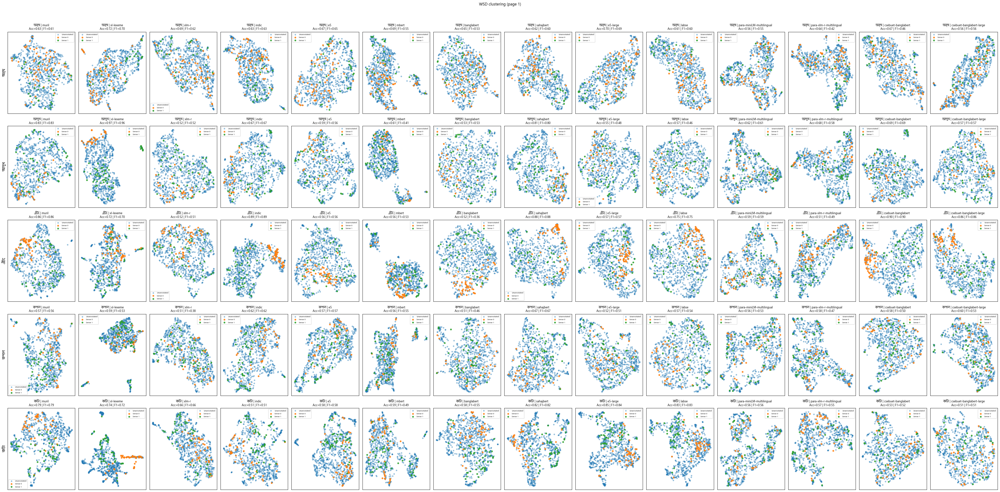

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\

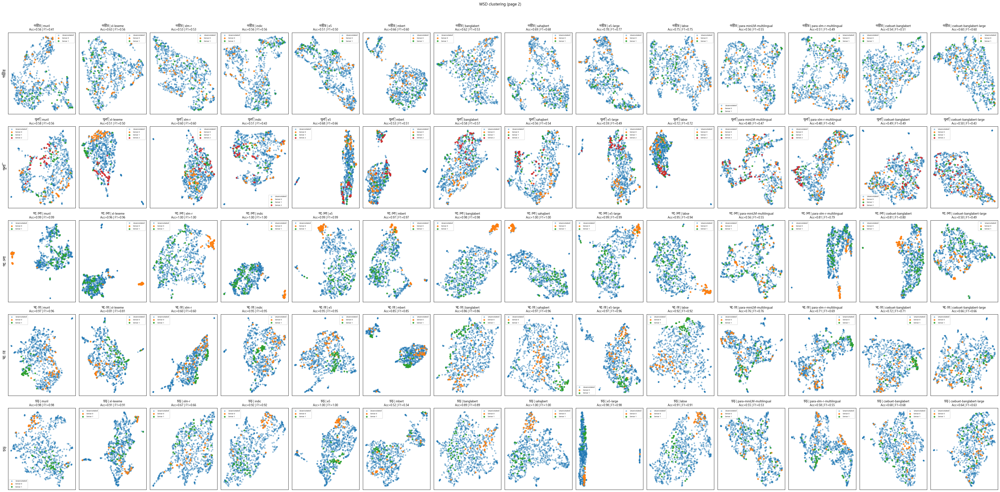

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\

In [ ]:
# Import stdlib and libs; set matplotlib to use Nirmala UI (Bangla-friendly)
import os, gc                                  # OS paths/directories; garbage collection helper
import pandas as pd                             # DataFrame I/O and manipulation
import numpy as np                              # Numerical arrays and ops
import matplotlib                               # Matplotlib global config
matplotlib.rcParams['font.family'] = 'Nirmala UI'  # Use Bangla-capable font globally
import matplotlib.pyplot as plt                 # Plotting API
plt.rcParams['font.family'] = 'Nirmala UI'     # Redundant safety: also set on pyplot
import torch, umap                              # PyTorch; UMAP for 2D projection
from sklearn.cluster import KMeans              # K-Means clustering
from sklearn.metrics import accuracy_score, f1_score  # Metric utilities (used after label matching)
from sentence_transformers import SentenceTransformer  # Embedding backbones

# Configuration
merge_folder = r'C:\Users\Student\Downloads\projecting_sentences-main\projecting_sentences-main\Merged_dataset'  # Input merged data
perf_folder  = r'C:\Users\Student\Downloads\projecting_sentences-main\projecting_sentences-main\wsd_perf'        # Output metrics/figures
os.makedirs(perf_folder, exist_ok=True)               # Ensure output folder exists
master_csv = os.path.join(perf_folder, 'model_performance_master.csv')  # Path to append-only master CSV
WORDS_PER_PAGE = 5  # number of words to plot per figure  # Pagination for grids

# Discover words
WORDS = sorted(                                      # Build sorted list of (lemma, csv_path)
    [(f[:-len('_merged.csv')], os.path.join(merge_folder, f))  # Strip suffix to get lemma
     for f in os.listdir(merge_folder) if f.endswith('_merged.csv')],  # Only merged CSVs
    key=lambda x: x[0]                               # Sort by lemma
)
print("Loaded words/files:", [w for w, _ in WORDS])  # Log discovered lemmas
if not WORDS:                                        # Fail fast if none found
    raise SystemExit(f"No *_merged.csv in {merge_folder}")

# models
MODELS = [                                           # Panel of models to compare (name, HF id)
    ('muril', "google/muril-base-cased"),
    ('xl-lexeme', "pierluigic/xl-lexeme"),
    ('xlm-r', "xlm-roberta-base"),
    ('indic', "ai4bharat/IndicBERTv2-MLM-only"),
    ('e5', 'intfloat/multilingual-e5-base'),
    ('mbert', "bert-base-multilingual-cased"),
    ('banglabert', "sagorsarker/bangla-bert-base"),
    ('sahajbert', "neuropark/sahajBERT"),
    ('e5-large', 'intfloat/multilingual-e5-large'),
    ('labse', 'sentence-transformers/LaBSE'),
    ('para-miniLM-multilingual', 'sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2'),
    ('para-xlm-r-multilingual', 'sentence-transformers/paraphrase-xlm-r-multilingual-v1'),
    ('csebuet-banglabert', "csebuetnlp/banglabert"),
    ('csebuet-banglabert-large', "csebuetnlp/banglabert_large"),
]
device = 'cuda' if torch.cuda.is_available() else 'cpu'  # Prefer GPU if available

# Helpers
_model_cache = {}                                  # Cache to avoid reloading models repeatedly


# Function: get_embeddings(model_id, sentences)
# Purpose: Encode a list of sentences into dense embeddings using a Sentence-Transformers model. Adds the "query: " prefix for E5 models and caches model instances to avoid reloading.
# Inputs:
#   model_id (str): Hugging Face model repo ID.
#   sentences (list[str]): Sentences to encode.
# Outputs:
#   np.ndarray[float] of shape (N, D): sentence embeddings.
def get_embeddings(model_id, sentences):           # Encode sentences with a given model
    sents = [f"query: {s}" for s in sentences] if 'e5' in model_id.lower() else sentences  # E5 prefix
    if model_id not in _model_cache:               # Lazy-load and cache the model
        _model_cache[model_id] = SentenceTransformer(model_id, device=device)
    model = _model_cache[model_id]                 # Fetch from cache
    with torch.inference_mode():                   # Disable grad for speed/memory
        return model.encode(sents, batch_size=32, show_progress_bar=False, convert_to_numpy=True)  # Get embeddings


# Function: load_sentences_and_labels(csv_path)
# Purpose: Load a merged lemma CSV; ensure there’s a sentence column; coerce/insert a sense column; parse sense labels as integers with unknowns set to -1; return sentences, numeric labels, and the set of unique gold senses.
# Inputs:
#   csv_path (str): Path to the merged CSV.
# Outputs:
#   sentences (list[str]), senses (list[int] with -1 for unknown), uniq (sorted list[int] of known sense IDs).
def load_sentences_and_labels(csv_path):           # Read merged CSV; return sentences, labels, unique senses
    df = pd.read_csv(csv_path, dtype={'sense': 'str'})      # Read CSV; keep sense as string for parsing
    if 'sentence' not in df.columns:                        # If schema lacks 'sentence'
        df = df.rename(columns={df.columns[0]: 'sentence'}) # Use first column as sentence
    if 'sense' not in df.columns:                           # If no sense column
        df['sense'] = ''                                    # Create empty sense
    sents = df['sentence'].astype(str).tolist()             # Sentences as strings
    senses = [int(x) if (isinstance(x, str) and x.strip().isdigit()) else -1 for x in df['sense']]  # Parse to ints; unknown→-1
    uniq = sorted({s for s in senses if s >= 0})            # Unique labeled senses
    return sents, senses, uniq                              # Return payload


# Function: clustering_metrics(true_labels, cluster_labels)
# Purpose: Compute accuracy and macro-F1 after optimally matching cluster IDs to gold sense IDs (label-permutation invariant), using the Hungarian algorithm.
# Inputs:
#   true_labels (Iterable[int]): Gold labels.
#   cluster_labels (Iterable[int]): Cluster assignments.
# Outputs:
#   (acc: float, f1: float): accuracy and macro-F1.
def clustering_metrics(true_labels, cluster_labels):        # Align clusters to labels; compute Acc & Macro-F1
    from scipy.optimize import linear_sum_assignment        # Hungarian algorithm
    y_true = np.array(true_labels); y_pred = np.array(cluster_labels)  # To arrays
    if len(y_true) == 0:                                    # Edge case: nothing labeled
        return 0.0, 0.0
    D = int(max(y_pred.max(initial=0), y_true.max(initial=0)) + 1)    # #classes upper bound
    cost = np.zeros((max(D,1), max(D,1)), dtype=int)        # Confusion counts matrix
    for i in range(len(y_true)):                            # Populate counts by (pred, true)
        cost[y_pred[i], y_true[i]] += 1
    r, c = linear_sum_assignment(cost.max() - cost)         # Maximize matches via cost transform
    mapping = {ri: ci for ri, ci in zip(r, c)}              # Pred→True mapping
    mapped = [mapping.get(t, 0) for t in y_pred]            # Remap predictions
    return accuracy_score(y_true, mapped), f1_score(y_true, mapped, average='macro')  # Metrics


# Function: append_master(rows)
# Purpose: Append a list of metric rows to the master CSV (or create it if missing).
# Inputs:
#   rows (list[dict]): Each dict typically has word, model, acc, f1.
# Outputs:
#   None (writes to disk).
def append_master(rows):                                    # Append rows to master CSV (create if missing)
    df = pd.DataFrame(rows)                                 # Build DataFrame batch
    if os.path.exists(master_csv):                          # Append if file exists
        df.to_csv(master_csv, mode='a', header=False, index=False, encoding='utf-8-sig')
    else:                                                   # Else create with header
        df.to_csv(master_csv, index=False, encoding='utf-8-sig')


# Build list of words that still need processing
remaining = []                                              # Lemmas not yet processed
for word, path in WORDS:                                    # Check each discovered lemma
    lemma_csv = os.path.join(perf_folder, f'{word}_performance.csv')  # Per-lemma perf CSV path
    if os.path.exists(lemma_csv):                           # If already computed
        print(f"[skip] {word}: already has {lemma_csv}")    # Log skip
    else:
        remaining.append((word, path))                      # Queue for processing

if not remaining:                                           # If everything done…
    print("\nEverything already processed. Generating summary from master CSV (if present).")  # Explain next
    if os.path.exists(master_csv):                          # If master exists, summarize
        summary_df = pd.read_csv(master_csv)                # Load all rows
        summary_table = summary_df.groupby('model')[['acc','f1']].agg(['mean','std']).reset_index()  # Mean/Std by model
        summary_table.columns = ['Model', 'Mean Acc', 'Std Acc', 'Mean F1', 'Std F1']                # Tidy columns
        print("\nModel Performance Summary:\n")             # Header
        for _, r in summary_table.iterrows():               # Pretty print rows
            print(f"{r['Model']:<30} {r['Mean Acc']:.3f}  {r['Std Acc']:.3f}  {r['Mean F1']:.3f}  {r['Std F1']:.3f}")
    else:
        print("No master CSV found. Nothing to summarize.") # Nothing to do
    raise SystemExit()                                      # Exit program


# Main: paginate remaining words (5 per figure)
all_rows = []                                                # session collection               
for start in range(0, len(remaining), WORDS_PER_PAGE):       # Page through lemmas
    batch = remaining[start:start+WORDS_PER_PAGE]            # Current page
    n_rows, n_cols = len(batch), len(MODELS)                 # Grid size

    fig_w = max(16, 3.0*n_cols)                              # Figure width heuristic
    fig_h = max(6, 4.2*n_rows)                               # Figure height heuristic
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(fig_w, fig_h))  # Create subplot grid
    axs = np.atleast_2d(axs)                                 # Ensure 2D indexing
    plt.subplots_adjust(wspace=0.35, hspace=0.6)             # Spacing between panels
    fig.suptitle(f"WSD clustering (page {start//WORDS_PER_PAGE+1})", y=0.98)  # Page title

    for i, (word, csv_path) in enumerate(batch):             # For each lemma on this page
        sentences, senses, unique_senses = load_sentences_and_labels(csv_path)  # Load data
        senses_np = np.array(senses)                          # Numpy array for indexing

        word_rows = []                                       # Rows to log for this lemma
        for j, (model_name, model_id) in enumerate(MODELS):  # For each model column
            ax = axs[i, j]                                   # Current axes
            try:
                emb = get_embeddings(model_id, sentences)    # Encode sentences
            except Exception as e:                           # Robustness: model load/encode failure
                print(f"Model failed: {model_name}, {e}")    # Log error
                emb = np.random.randn(len(sentences), 384)   # Fallback: random embeddings

            reducer = umap.UMAP(n_components=2, metric='cosine', n_neighbors=15, min_dist=0.1, random_state=42)  # UMAP config
            coords = reducer.fit_transform(emb); coords = np.asarray(coords)  # 2D coordinates

            # plot
            unann = np.where(senses_np == -1)[0]             # Indices of unannotated sentences
            if len(unann):                                   # If any
                ax.scatter(coords[unann,0], coords[unann,1], s=12, alpha=0.4, label='Unannotated')  # Scatter unannotated
            ann = np.where(senses_np >= 0)[0]                # Indices of labeled sentences
            acc = f1 = 0.0                                   # Default metrics
            if len(unique_senses) and len(ann):              # Cluster only if labels exist
                km = KMeans(n_clusters=len(unique_senses), random_state=42).fit(emb[ann])  # K-Means on labeled subset
                cl = np.full_like(senses_np, -1); cl[ann] = km.labels_                      # Fill labels for labeled rows
                acc, f1 = clustering_metrics(senses_np[ann], cl[ann])                       # Compute metrics
                for k, sense in enumerate(unique_senses):     # For each sense class
                    idx = ann[senses_np[ann] == sense]        # Indices of that sense
                    if len(idx):
                        ax.scatter(coords[idx,0], coords[idx,1], s=18, alpha=0.85, label=f'Sense {sense}')  # Scatter per sense
            ax.set_title(f"{word} | {model_name}\nAcc={acc:.2f} | F1={f1:.2f}", fontsize=9)  # Panel title with scores
            ax.set_xticks([]); ax.set_yticks([])             # Hide axes ticks
            if j == 0:
                ax.set_ylabel(word, fontsize=11)             # Row label on first column
            ax.legend(fontsize=6, loc='best')                # Compact legend

            row = {'word': word, 'model': model_name, 'acc': acc, 'f1': f1}  # Metrics row
            word_rows.append(row); all_rows.append(row)       # Collect for lemma and session

            # free
            del emb, coords, reducer                          # Release local arrays/objects
            gc.collect()                                      # Run GC
            if torch.cuda.is_available():                     # Also clear CUDA cache if present
                torch.cuda.empty_cache()

        # save per-lemma immediately (resume anchor)
        lemma_csv = os.path.join(perf_folder, f'{word}_performance.csv')  # Per-lemma CSV path
        pd.DataFrame(word_rows).to_csv(lemma_csv, index=False, encoding='utf-8-sig')  # Write lemma results
        # append to master incrementally
        append_master(word_rows)                              # Append to master CSV

    plt.tight_layout(rect=[0,0,1,0.96])                       # Tight layout with top title preserved
    plt.show()                                                # Render page
    plt.close(fig)                                            # Close figure to free memory
    gc.collect()                                              # Collect garbage
    if torch.cuda.is_available():                             # Clear CUDA cache again
        torch.cuda.empty_cache()


**Session Performance Summary & Bar-Chart Visualization**

This code summarizes per-model clustering performance collected during the current session (from all_rows). If any rows exist, it:

 1) Builds a DataFrame from all_rows.
 2) Computes mean and standard deviation of Accuracy and Macro-F1 per model.
 3) Prints a tidy, human-readable table to the console.
 4) Plots a side-by-side bar chart (Mean Acc vs. Mean F1) with error bars (their std dev), labeled by model.

In [ ]:
# Summary for this session
if all_rows:  # Only proceed if the session collected any rows (list of dicts with 'model','acc','f1')
    summary_df = pd.DataFrame(all_rows)  # Convert the session rows to a DataFrame

    # Group by model and compute mean and std for accuracy and F1; reset index to get a flat table
    summary_table = summary_df.groupby('model')[['acc','f1']].agg(['mean','std']).reset_index()

    # Flatten MultiIndex columns to simple names for printing/plotting
    summary_table.columns = ['Model', 'Mean Acc', 'Std Acc', 'Mean F1', 'Std F1']

    # Print a console header for the session summary
    print("\nModel Performance Summary (this session):\n")

    # Iterate through the summary rows and print a neat line per model with 3-decimal formatting
    for _, r in summary_table.iterrows():
        print(f"{r['Model']:<30} {r['Mean Acc']:.3f}  {r['Std Acc']:.3f}  {r['Mean F1']:.3f}  {r['Std F1']:.3f}")
        
    # Bar plot for average accuracy and F1 per model (side by side)

    x = np.arange(len(summary_table['Model']))  # Numeric positions for each model on the x-axis
    width = 0.35                                # Half-width of each bar (so pairs sit side by side)

    plt.figure(figsize=(12,6))  # Create a new figure with a readable size
    # Plot mean accuracy bars offset to the left, with std-dev error bars
    plt.bar(x - width/2, summary_table['Mean Acc'], yerr=summary_table['Std Acc'], width=width, label='Mean Acc')
    # Plot mean F1 bars offset to the right, with std-dev error bars, in a contrasting color
    plt.bar(x + width/2, summary_table['Mean F1'], yerr=summary_table['Std F1'], width=width, label='Mean F1', color='tomato')

    plt.xticks(x, summary_table['Model'], rotation=20)  # Label x-axis with model names, slightly rotated
    plt.ylabel("Score")                                  # Y-axis label indicating metric values
    plt.title("Model Average Accuracy & F1 Score with std dev")  # Descriptive plot title
    plt.legend()                                         # Show legend for Acc vs. F1 bars
    plt.tight_layout()                                   # Adjust layout to prevent label overlap
    plt.show()                                           # Render the bar chart


Model	                    Mean Acc   Std Acc   Mean F1   Std F1
banglabert	                  0.704	    0.163	  0.677	   0.188
csebuet-banglabert	          0.613 	0.115  	  0.593    0.125
csebuet-banglabert-large	  0.572  	0.110  	  0.553    0.124
e5	                          0.769  	0.187  	  0.760    0.196
e5-large	                  0.761  	0.173  	  0.743    0.194
indic	                      0.763  	0.160  	  0.750    0.173
labse	                      0.783  	0.156  	  0.766    0.174
mbert	                      0.712  	0.171  	  0.678    0.200
muril	                      0.793  	0.167  	  0.774    0.187
para-miniLM-multilingual	  0.562  	0.095	  0.553    0.095
para-xlm-r-multilingual	      0.584  	0.096  	  0.521	   0.128
sahajbert	                  0.842  	0.156  	  0.837    0.163
xl-lexeme	                  0.764  	0.159  	  0.741    0.187
xlm-r	                      0.609  	0.118  	  0.588    0.132


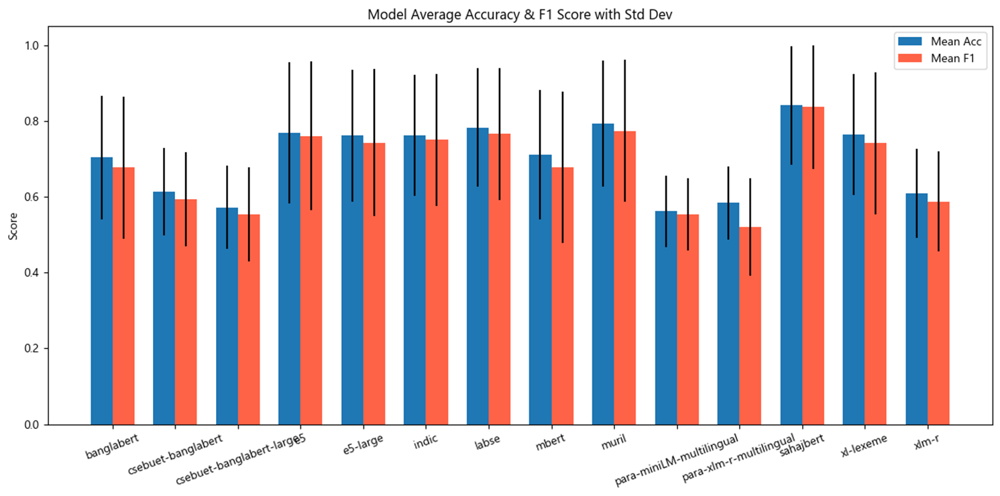

**Weighted Feature-Level Ensemble for Bangla WSD (Strict Per-Lemma, Top-6 Models)**

This script builds a strict per-lemma, feature-level ensemble for Bangla word sense disambiguation (WSD). For each lemma, it loads sentence data, fetches the per-lemma F1 scores of the top-6 backbone models (SahajBERT, MuRIL, LaBSE, E5, XL-Lexeme, IndicBERT), and uses those F1 values as weights to fuse model embeddings. The fusion pipeline L2-normalizes → weights → concatenates the per-model vectors and (optionally) reduces the fused vector via PCA. It then applies UMAP for visualization, K-Means for clustering on annotated examples only, evaluates accuracy & macro-F1 via Hungarian assignment, saves per-lemma results, appends to an ensemble master CSV, and plots a paginated grid (6×8) of lemmas per figure.

 1) Discover lemmas from _merged.csv files.
 2) Load per-lemma model F1 weights from model_performance_master.csv (strict—no fallbacks).
 3) Encode sentences using each of the top-6 models (E5 gets the "query: " prefix).
 4) L2-normalize, weight, and concatenate embeddings → fused vector; optionally PCA.
 5) UMAP → K-Means on annotated items; compute Acc/F1 with Hungarian mapping.
 6) Save per-lemma CSV, append to ensemble master CSV, and draw paginated grids of scatter plots.
 7) Print session summary for the ensemble.

In [3]:
import os, gc  # OS utilities & garbage collection
import pandas as pd  # DataFrame handling
import numpy as np  # Numerical arrays & math
import matplotlib  # Plot styling backend
matplotlib.rcParams['font.family'] = 'Nirmala UI'  # Ensure Bangla-supporting font globally
import matplotlib.pyplot as plt  # Plotting API
plt.rcParams['font.family'] = 'Nirmala UI'  # Double-ensure font at pyplot-level
import torch, umap  # Torch for device checks; UMAP for dimensionality reduction
from sklearn.cluster import KMeans  # Clustering
from sklearn.metrics import accuracy_score, f1_score  # Evaluation metrics
from sklearn.decomposition import PCA  # Optional PCA reduction
from sentence_transformers import SentenceTransformer  # Embedding backbones
import math  # Misc numeric helpers (not strictly required, but harmless)

# Config
merge_folder   = r'C:\Users\Student\Downloads\projecting_sentences-main\projecting_sentences-main\Dataset\Merged_dataset'  # Input folder of *_merged.csv per lemma
perf_folder    = r'C:\Users\Student\Documents\Bangla\Nadim\wsd_perf'  # Output folder for ensemble artifacts
os.makedirs(perf_folder, exist_ok=True)  # Create output folder if missing

# Per-model performance (already computed earlier)
weights_csv    = r'C:\Users\Student\Downloads\projecting_sentences-main\projecting_sentences-main\Result\wsd_perf\model_performance_master.csv'  # Source of per-lemma F1 weights
# Ensemble results go here
ensemble_master_csv = os.path.join(perf_folder, 'ensemble6_wfe_master.csv')  # Append-only master for ensemble results

# Plotting grid: 6 rows × 8 columns per figure
GRID_ROWS = 6  # Rows per figure page
GRID_COLS = 8  # Columns per figure page
LEMMAS_PER_PAGE = GRID_ROWS * GRID_COLS  # Max panels per page

PCA_DIM = 256        # Optional PCA target dimension (set None to disable PCA)
SHOW_PLOTS = True    # Toggle plotting on/off

# Top-6 models (short name -> HF id)
TOP6 = {
    'sahajbert': 'neuropark/sahajBERT',          # Bangla-oriented multilingual ST model
    'muril':     'google/muril-base-cased',      # MuRIL
    'labse':     'sentence-transformers/LaBSE',  # LaBSE
    'e5':        'intfloat/multilingual-e5-base',# E5 (needs "query: " prefix)
    'xl-lexeme': 'pierluigic/xl-lexeme',         # XL-Lexeme
    'indic':     'ai4bharat/IndicBERTv2-MLM-only',# IndicBERT v2 (MLM only)
}
TOP6_NAMES = list(TOP6.keys())  # Convenience list of model short names
ENSEMBLE_MODEL_NAME = 'ensemble-6-wfe'  # Label used in saved CSVs

device = 'cuda' if torch.cuda.is_available() else 'cpu'  # Choose GPU if available

# Discover lemmas
WORDS = sorted(  # Build (lemma, path) list from *_merged.csv files
    [(f[:-len('_merged.csv')], os.path.join(merge_folder, f))
     for f in os.listdir(merge_folder) if f.endswith('_merged.csv')],
    key=lambda x: x[0]
)
print("Loaded words/files:", [w for w, _ in WORDS])  # Log discovered lemmas
if not WORDS:
    raise SystemExit(f"No *_merged.csv in {merge_folder}")  # Abort if nothing to process

# Helpers
_model_cache = {}  # Cache for SentenceTransformer instances to avoid reloads

# Function: get_embeddings(model_id, sentences)
# Purpose: Encodes a list of sentences into dense vectors using a cached SentenceTransformer. If the model is an E5 variant, it prefixes each sentence with "query: " as required by E5.
# Inputs:
#   model_id (str): Hugging Face model ID (e.g., "neuropark/sahajBERT", "intfloat/multilingual-e5-base").
#   sentences (List[str]): Sentences to embed.
# Outputs:
#   (np.ndarray): Embedding matrix of shape (N, D) where N is the number of sentences and D is the model’s embedding size.
def get_embeddings(model_id, sentences):
    """Encode sentences with caching; add 'query:' prefix for e5."""
    sents = [f"query: {s}" for s in sentences] if 'e5' in model_id.lower() else sentences  # E5 expects "query: " prefix
    if model_id not in _model_cache:  # Load & cache model on first use
        _model_cache[model_id] = SentenceTransformer(model_id, device=device)
    with torch.inference_mode():  # No gradients during encoding
        return _model_cache[model_id].encode(
            sents, batch_size=32, show_progress_bar=False, convert_to_numpy=True
        )


# Function: load_sentences_and_labels(csv_path)
# Purpose: Loads a merged per-lemma CSV, normalizes schema, and returns sentences with numeric sense labels. Unannotated/blank sense values are mapped to -1.
# Inputs:
#   csv_path (str): Path to a *_merged.csv file.
# Outputs:
#   sents (List[str]): List of sentences.
#   senses (np.ndarray of int): Parallel list of sense IDs (-1 for unannotated).
#   uniq (List[int]): Sorted list of unique annotated sense IDs (i.e., values ≥ 0).
def load_sentences_and_labels(csv_path):
    df = pd.read_csv(csv_path, dtype={'sense': 'str'})  # Read merged CSV; keep sense as string
    if 'sentence' not in df.columns:  # If schema differs, rename first column to 'sentence'
        df = df.rename(columns={df.columns[0]: 'sentence'})
    if 'sense' not in df.columns:  # If no sense column, create blank
        df['sense'] = ''
    sents = df['sentence'].astype(str).tolist()  # Ensure string sentences
    senses = [int(x) if (isinstance(x, str) and x.strip().isdigit()) else -1 for x in df['sense']]  # Blank/non-numeric → -1
    uniq = sorted({s for s in senses if s >= 0})  # Unique gold senses present
    return sents, np.array(senses), uniq  # Return sentences, numeric labels, and sense set


# Function: clustering_metrics(true_labels, cluster_labels)
# Purpose: Evaluates clustering vs. gold labels using the Hungarian algorithm to align cluster IDs to true labels, then computes accuracy and macro-F1.
# Inputs:
#   true_labels (Iterable[int]): Gold sense IDs for the evaluated items.
#   cluster_labels (Iterable[int]): Cluster IDs predicted for those same items.
# Outputs:
#   (acc, f1) (Tuple[float, float]): Accuracy and macro-F1 scores.
def clustering_metrics(true_labels, cluster_labels):
    from scipy.optimize import linear_sum_assignment  # Hungarian algorithm
    y_true = np.asarray(true_labels); y_pred = np.asarray(cluster_labels)  # Ensure arrays
    if y_true.size == 0:  # No annotated labels → zero scores
        return 0.0, 0.0
    D = int(max(y_pred.max(initial=0), y_true.max(initial=0)) + 1)  # Max label id + 1
    cost = np.zeros((max(D,1), max(D,1)), dtype=int)  # Cost matrix
    for i in range(len(y_true)):  # Build contingency (inverse for minimization)
        cost[y_pred[i], y_true[i]] += 1
    r, c = linear_sum_assignment(cost.max() - cost)  # Maximize matches via min-cost trick
    mapping = {ri: ci for ri, ci in zip(r, c)}  # Map cluster id → gold label
    mapped = np.array([mapping.get(t, 0) for t in y_pred])  # Remap predictions
    return accuracy_score(y_true, mapped), f1_score(y_true, mapped, average='macro')  # Acc & macro-F1


# Function: get_strict_per_lemma_weights(weights_csv_path, model_names, word)
# Purpose: Fetches strict per-lemma weights (F1 scores) for the requested models and lemma. Normalizes weights around 1.0 and clips to [0.5, 2.0]. Raises if any model’s F1 is missing for that lemma.
# Inputs:
#   weights_csv_path (str): Path to model_performance_master.csv.
#   model_names (List[str]): Short names of models (e.g., ['sahajbert','muril',...]).
#   word (str): Lemma whose per-model F1 weights are required.
# Outputs:
#   (Dict[str, float]): {model_name: normalized_weight}.
def get_strict_per_lemma_weights(weights_csv_path, model_names, word):
    """
    Strict per-lemma weights: {model_name: F1_for_this_lemma}.
    No global fallback, no 1.0 default. Raises if any model is missing.
    """
    if not os.path.exists(weights_csv_path):  # Ensure weights CSV exists
        raise FileNotFoundError(f"Per-lemma weights file not found: {weights_csv_path}")

    df = pd.read_csv(weights_csv_path)  # Load master performance table
    if not {'word','model','f1'}.issubset(df.columns):  # Validate schema
        raise ValueError("Weights CSV must have columns: 'word', 'model', 'f1'")

    sub = df[df['word'] == word].groupby('model')['f1'].mean()  # Per-model F1 for this lemma
    missing = [m for m in model_names if m not in sub.index]  # Detect missing models
    if missing:
        raise ValueError(f"Missing per-lemma F1 for word='{word}' and models: {missing}")

    # Normalize weights around 1 and clip for stability
    weights = {m: float(sub[m]) for m in model_names}  # Raw F1s
    arr = np.array([weights[m] for m in model_names], dtype=float)  # Vectorize
    arr = arr / (arr.mean() + 1e-12)  # Center around 1.0
    arr = np.clip(arr, 0.5, 2.0)  # Prevent extreme scaling
    return {m: float(a) for m, a in zip(model_names, arr)}  # Return per-model weight dict



# Function: get_ensemble_embeddings(sentences, top6_dict, weights_dict, pca_dim=PCA_DIM)
# Purpose: Builds a feature-level ensemble: for each model, embeds sentences, L2-normalizes, multiplies by its per-lemma weight, and concatenates across models. Optionally applies PCA to the fused vectors.
# Inputs:
#   sentences (List[str]): Sentences to embed and fuse.
#   top6_dict (Dict[str, str]): {short_name: hf_id} mapping for the six models.
#   weights_dict (Dict[str, float]): Per-lemma weights from get_strict_per_lemma_weights.
#   pca_dim (Optional[int]): Target dimensionality for PCA; if None, PCA is skipped.
# Outputs:
#   (np.ndarray): Fused (optionally PCA-reduced) embedding matrix of shape (N, F).
def get_ensemble_embeddings(sentences, top6_dict, weights_dict, pca_dim=PCA_DIM):
    """Weighted feature-level fusion: L2-normalize per model, weight, concat, optional PCA."""
    parts = []  # Accumulate weighted embeddings
    for name, hf_id in top6_dict.items():  # Iterate through the 6 models
        emb = get_embeddings(hf_id, sentences)  # Encode sentences
        denom = np.linalg.norm(emb, axis=1, keepdims=True) + 1e-12  # L2 norms
        emb = emb / denom  # L2-normalize vectors
        w = float(weights_dict[name])  # strictly per-lemma weight
        parts.append(emb * w)  # Scale embedding block
    fused = np.concatenate(parts, axis=1)  # Concatenate along feature axis
    if pca_dim is not None and fused.shape[1] > pca_dim:  # Optional PCA compression
        fused = PCA(n_components=pca_dim, random_state=42).fit_transform(fused)
    return fused  # Return fused (optionally reduced) embeddings



# Function: save_append_master(rows, path)
# Purpose: Appends a small result table (list of dict rows) to a CSV file, creating it with a header if it doesn’t exist.
# Inputs:
#   rows (List[Dict]): Each dict row should share the same keys (e.g., {'word','model','acc','f1'}).
#   path (str): Destination CSV path.
# Outputs:
#   None (writes to disk).
def save_append_master(rows, path):
    df = pd.DataFrame(rows)  # Convert list of dicts → DataFrame
    if os.path.exists(path):  # Append if file exists
        df.to_csv(path, mode='a', header=False, index=False, encoding='utf-8-sig')
    else:  # Otherwise write with header
        df.to_csv(path, index=False, encoding='utf-8-sig')

# Only process lemmas that are not yet saved
remaining = []  # Worklist of (word, file_path) not processed yet
for word, fp in WORDS:  # Iterate discovered lemmas
    lemma_csv = os.path.join(perf_folder, f'{word}_ensemble6_wfe.csv')  # Per-lemma output CSV path
    if os.path.exists(lemma_csv):  # Skip if already computed
        print(f"[skip] {word}: already has {lemma_csv}")
    else:
        remaining.append((word, fp))  # Queue for processing

if not remaining:  # If everything is done, print summary (if available) and exit
    print("\nEverything already processed for ensemble.")
    if os.path.exists(ensemble_master_csv):  # Summarize from master CSV
        m = pd.read_csv(ensemble_master_csv)
        summary = m.groupby('model')[['acc','f1']].agg(['mean','std']).reset_index()
        summary.columns = ['Model','Mean Acc','Std Acc','Mean F1','Std F1']
        print("\nEnsemble Summary (from master):\n")
        for _, r in summary.iterrows():
            print(f"{r['Model']:<18} {r['Mean Acc']:.3f}  {r['Std Acc']:.3f}  {r['Mean F1']:.3f}  {r['Std F1']:.3f}")
    raise SystemExit()  # Nothing to do → exit cleanly

# Main: paginated over 6×8 grid
all_rows = []  # Collect per-lemma rows for session summary
for start in range(0, len(remaining), LEMMAS_PER_PAGE):  # Process in pages
    batch = remaining[start:start+LEMMAS_PER_PAGE]  # Current page subset
    n_rows, n_cols = GRID_ROWS, GRID_COLS  # Grid dimensions
    total_slots = n_rows * n_cols  # Total panels in the grid

    if SHOW_PLOTS:
        fig_w = max(18.0, 2.5 * n_cols)  # Figure width heuristic
        fig_h = max(10.0, 2.5 * n_rows)  # Figure height heuristic
        fig, axs = plt.subplots(n_rows, n_cols, figsize=(fig_w, fig_h))  # Create grid figure

        # ensure (n_rows, n_cols)
        axs = np.array(axs).reshape(n_rows, n_cols)  # Robustly shape axes
        plt.subplots_adjust(wspace=0.25, hspace=0.5)  # Spacing between panels
        page_no = start // LEMMAS_PER_PAGE + 1  # 1-based page number
        fig.suptitle(f"Weighted Feature Ensemble (page {page_no})", y=0.98)  # Page title

    # draw each lemma into the grid
    for idx, (word, csv_path) in enumerate(batch):  # Loop over lemmas in this page
        r, c = divmod(idx, n_cols)  # Row/col index for subplot placement

        sentences, senses_np, unique_senses = load_sentences_and_labels(csv_path)  # Load data for this lemma

        # Strict per-lemma weights
        weights = get_strict_per_lemma_weights(weights_csv, TOP6_NAMES, word=word)  # Pull F1-based weights (strict)

        # Fused embeddings
        emb = get_ensemble_embeddings(sentences, TOP6, weights_dict=weights, pca_dim=PCA_DIM)  # Build ensemble vectors

        # UMAP for viz
        reducer = umap.UMAP(n_components=2, metric='cosine', n_neighbors=15, min_dist=0.1, random_state=42)  # 2D UMAP
        coords = reducer.fit_transform(emb); coords = np.asarray(coords)  # 2D coordinates for plotting

        # KMeans on annotated only
        ann = np.where(senses_np >= 0)[0]  # Indices of annotated rows
        acc = f1 = 0.0  # Default scores
        if len(unique_senses) and len(ann):  # Proceed only if we have gold labels
            km = KMeans(n_clusters=len(unique_senses), random_state=42).fit(emb[ann])  # Cluster annotated embeddings
            cl = np.full_like(senses_np, -1); cl[ann] = km.labels_  # Fill cluster labels; -1 for unannotated
            acc, f1 = clustering_metrics(senses_np[ann], cl[ann])  # Evaluate Acc/F1 on annotated subset

        # Plot in the grid
        if SHOW_PLOTS:
            ax = axs[r, c]  # Current subplot
            unann = np.where(senses_np == -1)[0]  # Unannotated indices
            if len(unann):
                ax.scatter(coords[unann,0], coords[unann,1], s=8, alpha=0.35, label='Unannotated')  # Grey points
            for s in unique_senses:  # Plot each sense cluster
                idx_s = ann[senses_np[ann] == s]
                if len(idx_s):
                    ax.scatter(coords[idx_s,0], coords[idx_s,1], s=12, alpha=0.85, label=f'Sense {s}')
            ax.set_title(f"{word} | {ENSEMBLE_MODEL_NAME}\nAcc={acc:.2f} | F1={f1:.2f}", fontsize=9)  # Panel title
            ax.set_xticks([]); ax.set_yticks([])  # Cleaner look: hide ticks
            ax.legend(fontsize=6, loc='best')  # Legend per panel

        # Save per-lemma + to master
        rows = [{'word': word, 'model': ENSEMBLE_MODEL_NAME, 'acc': acc, 'f1': f1}]  # One-row result
        all_rows.extend(rows)  # Add to session collection
        lemma_csv = os.path.join(perf_folder, f'{word}_ensemble6_wfe.csv')  # Per-lemma CSV path
        pd.DataFrame(rows).to_csv(lemma_csv, index=False, encoding='utf-8-sig')  # Write per-lemma result
        save_append_master(rows, ensemble_master_csv)  # Append to ensemble master CSV

        # free
        del emb, reducer, coords  # Free large arrays/objects
        gc.collect()  # Suggest GC
        if torch.cuda.is_available(): torch.cuda.empty_cache()  # Clear VRAM

    # Hide unused axes 
    if SHOW_PLOTS and len(batch) < total_slots:  # If grid has spare panels
        for idx in range(len(batch), total_slots):
            r, c = divmod(idx, n_cols)
            axs[r, c].axis('off')  # Hide empty axes

    if SHOW_PLOTS:
        plt.tight_layout(rect=[0,0,1,0.95]); plt.show(); plt.close(fig)  # Render and close figure
        gc.collect()  # Collect garbage
        if torch.cuda.is_available(): torch.cuda.empty_cache()  # Clear GPU cache

# Session summary 
if all_rows:  # If we produced any rows this run
    summary_df = pd.DataFrame(all_rows)  # Build DataFrame of results
    summary_table = summary_df.groupby('model')[['acc','f1']].agg(['mean','std']).reset_index()  # Mean/std per model
    summary_table.columns = ['Model', 'Mean Acc', 'Std Acc', 'Mean F1', 'Std F1']  # Friendly columns
    print("\nWeighted Feature Ensemble Summary (this session):\n")  # Header
    for _, r in summary_table.iterrows():  # Print table neatly
        print(f"{r['Model']:<18} {r['Mean Acc']:.3f}  {r['Std Acc']:.3f}  {r['Mean F1']:.3f}  {r['Std F1']:.3f}")


Loaded words/files: ['অর্থ', 'আগুন', 'এঁটে', 'কপাল', 'কাটা', 'গভীর', 'গুলি', 'গোলা', 'ঘোর', 'চড়', 'চাবি', 'চোখ', 'ঝোলা', 'ঠান্ডা', 'ডাক', 'তাড়া', 'তুলা', 'দম', 'দল', 'দাঁড়া', 'ধন', 'ধরা', 'পটল', 'পড়া', 'পথ', 'পদ', 'পর', 'পাকা', 'পাড়া', 'পালা', 'পিচ', 'ফল', 'বর্ণ', 'বল', 'বাড়ি', 'বিন্দু', 'মধু', 'মাটি', 'মাথা', 'মুখ', 'রূপ', 'সারা', 'হাত']
[skip] অর্থ: already has C:\Users\Student\Documents\Bangla\Nadim\wsd_perf\অর্থ_ensemble6_wfe.csv
[skip] আগুন: already has C:\Users\Student\Documents\Bangla\Nadim\wsd_perf\আগুন_ensemble6_wfe.csv
[skip] এঁটে: already has C:\Users\Student\Documents\Bangla\Nadim\wsd_perf\এঁটে_ensemble6_wfe.csv
[skip] কপাল: already has C:\Users\Student\Documents\Bangla\Nadim\wsd_perf\কপাল_ensemble6_wfe.csv
[skip] কাটা: already has C:\Users\Student\Documents\Bangla\Nadim\wsd_perf\কাটা_ensemble6_wfe.csv
[skip] গভীর: already has C:\Users\Student\Documents\Bangla\Nadim\wsd_perf\গভীর_ensemble6_wfe.csv
[skip] গুলি: already has C:\Users\Student\Documents\Bangla\Nadim\wsd_pe

SystemExit: 

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\IPython\core\interactiveshell.py:3680: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


******Comparison with Peers******

**Multi-Model Embeddings, UMAP Clustering & Performance Summary (Classmates dataset)**

This code evaluates Word Sense Disambiguation (WSD) clustering quality for Bangla words across multiple multilingual sentence-embedding models. It automatically discovers per-lemma merged datasets, projects sentence embeddings to 2D with UMAP for visualization, clusters only the annotated examples with K-Means, computes accuracy and macro-F1 via an optimal label mapping, and then summarizes results per model with both a printed table and bar charts.

 1) Discover inputs: Scan a folder for *_merged.csv files and build a (word, path) list.
 2) Define a suite of Hugging Face / Sentence-Transformers model IDs to test.
 3) Helpers:
     - get_embeddings(...) → encode sentences (adds "query: " prefix for E5).
     - load_sentences_and_labels(...) → load sentences and convert blank senses to -1.
     - clustering_metrics(...) → compute accuracy & macro-F1 using a Hungarian match between cluster IDs and true labels.
 4) Per-word × per-model loop:
     - Encode sentences, reduce to 2D with UMAP, plot unannotated vs. annotated points.
     - Run K-Means on annotated only; compute and record metrics.
 5) Create a grid of scatter plots (one row per word, one column per model).
 6) Aggregate results per model, print a table, and plot Mean Acc & Mean F1 (with std-dev error bars).

Loaded words/files: ['আলো', 'ডাল', 'পানি', 'বেগুনি', 'হলুদ']
Processing: আলো | muril


No sentence-transformers model found with name google/muril-base-cased. Creating a new one with mean pooling.
C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: আলো | xl-lexeme


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: আলো | xlm-r


No sentence-transformers model found with name xlm-roberta-base. Creating a new one with mean pooling.
C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name ai4bharat/IndicBERTv2-MLM-only. Creating a new one with mean pooling.


Processing: আলো | indic


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: আলো | e5


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name bert-base-multilingual-cased. Creating a new one with mean pooling.


Processing: আলো | mbert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name sagorsarker/bangla-bert-base. Creating a new one with mean pooling.


Processing: আলো | banglabert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name neuropark/sahajBERT. Creating a new one with mean pooling.


Processing: আলো | sahajbert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name google/muril-base-cased. Creating a new one with mean pooling.


Processing: ডাল | muril


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: ডাল | xl-lexeme


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name xlm-roberta-base. Creating a new one with mean pooling.


Processing: ডাল | xlm-r


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name ai4bharat/IndicBERTv2-MLM-only. Creating a new one with mean pooling.


Processing: ডাল | indic


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: ডাল | e5


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name bert-base-multilingual-cased. Creating a new one with mean pooling.


Processing: ডাল | mbert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name sagorsarker/bangla-bert-base. Creating a new one with mean pooling.


Processing: ডাল | banglabert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name neuropark/sahajBERT. Creating a new one with mean pooling.


Processing: ডাল | sahajbert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name google/muril-base-cased. Creating a new one with mean pooling.


Processing: পানি | muril


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: পানি | xl-lexeme


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name xlm-roberta-base. Creating a new one with mean pooling.


Processing: পানি | xlm-r


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name ai4bharat/IndicBERTv2-MLM-only. Creating a new one with mean pooling.


Processing: পানি | indic


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: পানি | e5


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name bert-base-multilingual-cased. Creating a new one with mean pooling.


Processing: পানি | mbert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name sagorsarker/bangla-bert-base. Creating a new one with mean pooling.


Processing: পানি | banglabert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name neuropark/sahajBERT. Creating a new one with mean pooling.


Processing: পানি | sahajbert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: বেগুনি | muril


No sentence-transformers model found with name google/muril-base-cased. Creating a new one with mean pooling.
C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: বেগুনি | xl-lexeme


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name xlm-roberta-base. Creating a new one with mean pooling.


Processing: বেগুনি | xlm-r


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name ai4bharat/IndicBERTv2-MLM-only. Creating a new one with mean pooling.


Processing: বেগুনি | indic


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: বেগুনি | e5


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name bert-base-multilingual-cased. Creating a new one with mean pooling.


Processing: বেগুনি | mbert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name sagorsarker/bangla-bert-base. Creating a new one with mean pooling.


Processing: বেগুনি | banglabert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name neuropark/sahajBERT. Creating a new one with mean pooling.


Processing: বেগুনি | sahajbert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name google/muril-base-cased. Creating a new one with mean pooling.


Processing: হলুদ | muril


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: হলুদ | xl-lexeme


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name xlm-roberta-base. Creating a new one with mean pooling.


Processing: হলুদ | xlm-r


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name ai4bharat/IndicBERTv2-MLM-only. Creating a new one with mean pooling.


Processing: হলুদ | indic


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: হলুদ | e5


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name bert-base-multilingual-cased. Creating a new one with mean pooling.


Processing: হলুদ | mbert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name sagorsarker/bangla-bert-base. Creating a new one with mean pooling.


Processing: হলুদ | banglabert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name neuropark/sahajBERT. Creating a new one with mean pooling.


Processing: হলুদ | sahajbert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



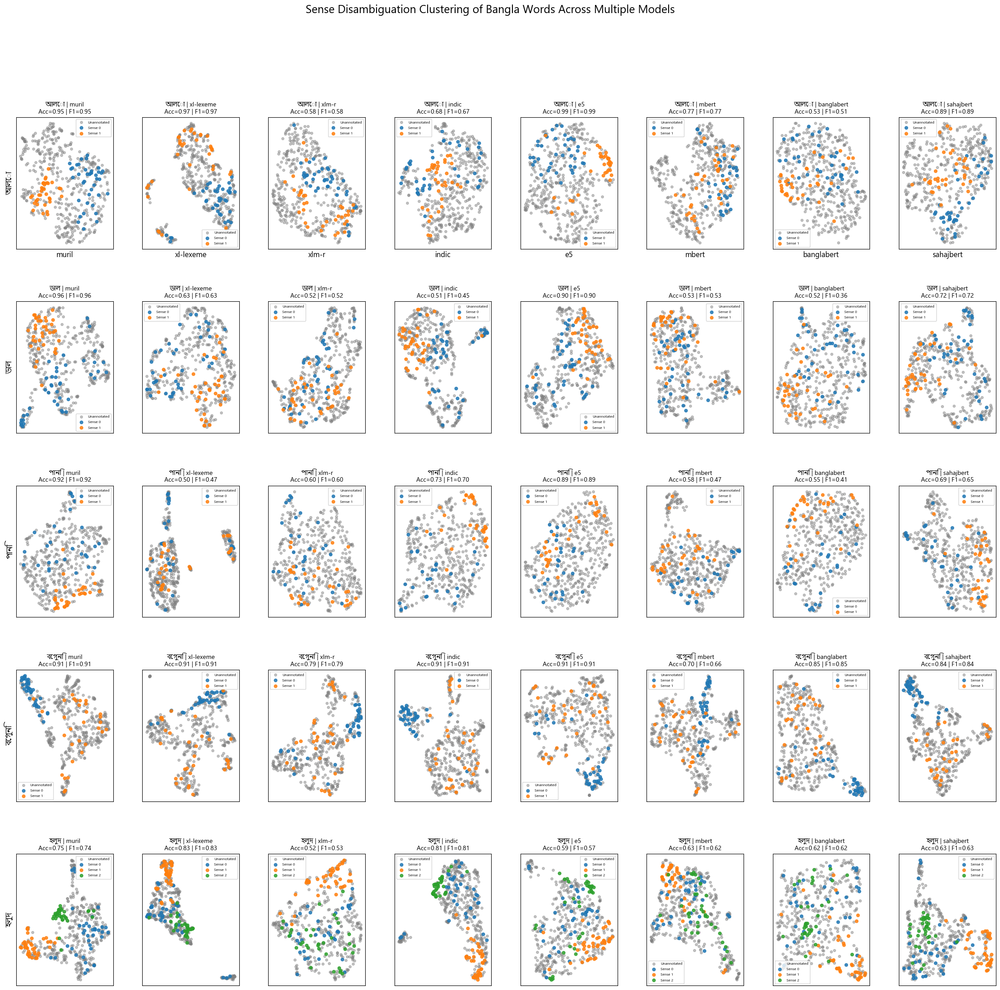


Model Performance Summary:

Model                          Mean Acc  Std Acc  Mean F1   Std F1
banglabert                     0.613    0.139   0.550   0.194
e5                             0.855    0.152   0.851   0.160
indic                          0.725    0.151   0.707   0.174
mbert                          0.642    0.095   0.612   0.115
muril                          0.898    0.084   0.896   0.088
sahajbert                      0.754    0.107   0.746   0.114
xl-lexeme                      0.770    0.198   0.763   0.208
xlm-r                          0.602    0.111   0.602   0.108


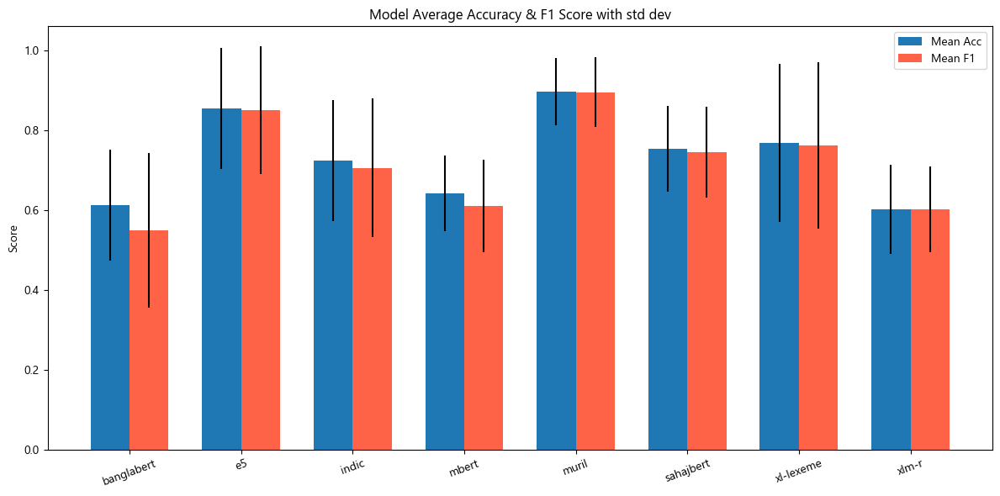

In [ ]:
import os                                  # Filesystem ops: list directories, path joins
import pandas as pd                        # Data loading/manipulation for CSVs
import numpy as np                         # Numerical arrays and math
import matplotlib                          # Matplotlib base (to set global rcParams)
matplotlib.rcParams['font.family'] = 'Nirmala UI'  # Bangla-supporting font for proper glyphs
import matplotlib.pyplot as plt            # Plotting API
plt.rcParams['font.family'] = 'Nirmala UI' # Ensure pyplot also uses the Bangla-capable font
import torch                               # Detect CUDA device, general tensor utilities
import umap                                # Dimensionality reduction to 2D for visualization
from sklearn.cluster import KMeans         # K-Means clustering for annotated points
from sklearn.metrics import accuracy_score, f1_score  # Metrics after label alignment
from sentence_transformers import SentenceTransformer  # Sentence embedding models

# 1. Auto-load all merged csv files in your folder
merge_folder = r'C:\Users\Student\Downloads\tonadim (2)\tonadim\merged1'  # Folder containing *_merged.csv per lemma
WORDS = []                              # Will hold tuples of (word, csv_path)
for fname in os.listdir(merge_folder):  # Iterate files in the merge folder
    if fname.endswith('_merged.csv'):   # Consider only merged CSVs
        word = fname.split('_merged.csv')[0]                 # Extract lemma from filename prefix
        WORDS.append((word, os.path.join(merge_folder, fname)))  # Record (lemma, absolute path)
print("Loaded words/files:", [w for w, _ in WORDS])          # Log the discovered lemmas

# 2. Define models to use (add more as needed)
MODELS = [                                                     # List of (short_name, HF model id)
    ('muril', "google/muril-base-cased"),
    ('xl-lexeme', "pierluigic/xl-lexeme"),
    ('xlm-r', "xlm-roberta-base"),
    ('indic', "ai4bharat/IndicBERTv2-MLM-only"),
    ('e5', 'intfloat/multilingual-e5-base'),
    ('mbert', "bert-base-multilingual-cased"),
    ('banglabert', "sagorsarker/bangla-bert-base"),    # BanglaBERT
    ('sahajbert', "neuropark/sahajBERT"), 
]

device = 'cuda' if torch.cuda.is_available() else 'cpu'       # Prefer GPU if available


# Function: get_embeddings(model_name, sentences)
# Purpose: Loads a Sentence-Transformers model (on GPU if available) and returns dense embeddings for the provided sentences. If the model name contains “e5”, it prefixes each sentence with "query: " to match E5’s training convention.
# Inputs:
#   model_name (str): Hugging Face model ID.
#   sentences (List[str]): Sentences to embed.
# Outputs:
#   emb (np.ndarray): Matrix of shape [num_sentences, embedding_dim].
def get_embeddings(model_name, sentences):
    """Encode sentences with a Sentence-Transformers model (adds 'query:' for E5)."""
    if 'e5' in model_name.lower():                            # E5 convention: prefix text with 'query: '
        sentences = [f"query: {s}" for s in sentences]        # Apply prefix to each sentence
    model = SentenceTransformer(model_name, device=device)    # Load model on the chosen device
    emb = model.encode(sentences, show_progress_bar=False, batch_size=32)  # Vectorize sentences
    return emb                                                # Return embeddings (np.ndarray)


# Function: load_sentences_and_labels(csv_path)
# Purpose: Reads a merged CSV containing a sentence column and an optional sense column. Converts blank/NaN senses to -1 (unannotated) and returns the list of sentences, integer sense labels, and the sorted list of unique annotated senses.
# Inputs:
#   csv_path (str): Path to the merged CSV.
#   sentences (List[str]): Sentences to embed.
# Outputs:
#   sentences (List[str])
#   gold_senses (List[int]): -1 for unannotated; otherwise 0/1/2/…
#   unique_senses (List[int]): Sorted unique annotated labels.
def load_sentences_and_labels(csv_path):
    """Load sentences and sense labels; blank/NaN sense -> -1; also return sorted unique annotated senses."""
    df = pd.read_csv(csv_path, dtype={'sense': 'str'})        # Read CSV, keep sense as string
    sentences = df['sentence'].tolist()                       # Extract sentences as list
    # Use -1 for unannotated (blank sense), else int(sense)
    gold_senses = [int(s) if (isinstance(s, str) and s.strip().isdigit()) else -1 for s in df['sense']]  # Normalize labels
    unique_senses = sorted(set([s for s in gold_senses if s >= 0]))  # Unique annotated label values
    return sentences, gold_senses, unique_senses              # Return sentences, labels, and label set


# Function: clustering_metrics(true_labels, cluster_labels)
# Purpose: Computes clustering accuracy and macro-F1 by aligning cluster IDs to gold labels via the Hungarian algorithm (maximizes correct matches).
# Inputs:
#   true_labels (Iterable[int]): Gold labels for the evaluated subset.
#   cluster_labels (Iterable[int]): K-Means cluster IDs for the same subset.
# Outputs:
#   (acc, f1) (Tuple[float, float]): Accuracy and macro-F1 after optimal relabeling.
def clustering_metrics(true_labels, cluster_labels):
    """Compute Acc & macro-F1 by mapping clusters to gold via Hungarian algorithm."""
    from scipy.optimize import linear_sum_assignment           # Optimal assignment for label alignment
    y_true = np.array(true_labels)                            # Convert gold labels to array
    y_pred = np.array(cluster_labels)                         # Convert cluster labels to array
    D = max(y_pred.max(), y_true.max()) + 1                   # Number of classes (max label + 1)
    cost = np.zeros((D, D), dtype=int)                        # Cost matrix for assignment
    for i in range(len(y_true)):                              # Populate cost matrix (confusion-like)
        cost[y_pred[i], y_true[i]] += 1                       # Count matches per (pred_cluster, true_label)
    row_ind, col_ind = linear_sum_assignment(cost.max() - cost)  # Maximize matches by minimizing complement
    mapping = {row: col for row, col in zip(row_ind, col_ind)}   # Map cluster -> gold label
    mapped = [mapping.get(c, 0) for c in y_pred]              # Relabel predictions to gold space
    acc = accuracy_score(y_true, mapped)                      # Compute accuracy after mapping
    f1 = f1_score(y_true, mapped, average='macro')            # Compute macro-F1 after mapping
    return acc, f1                                            # Return both metrics

color_map = ['grey', 'tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 'tab:brown',  # Colors per sense
             'tab:pink', 'tab:olive', 'tab:cyan', 'gold', 'deeppink', 'lime']

results = []                                                  # Collect per (word, model) metric rows

fig, axs = plt.subplots(len(WORDS), len(MODELS), figsize=(28, 5*len(WORDS)))  # Grid of subplots
plt.subplots_adjust(wspace=0.3, hspace=0.4)                   # Spacing between panels

for i, (word, csv_path) in enumerate(WORDS):                  # For each lemma and its CSV
    sentences, senses, unique_senses = load_sentences_and_labels(csv_path)  # Load data
    sentences, senses = sentences[:500], senses[:500]         # Limit to 500 for speed/clarity
    senses_np = np.array(senses)                              # Numpy view of labels

    for j, (model_name, model_id) in enumerate(MODELS):       # For each embedding model
        print(f"Processing: {word} | {model_name}")           # Progress log
        try:
            emb = get_embeddings(model_id, sentences)         # Compute sentence embeddings
        except Exception as e:                                # If model fails, fall back
            print(f"Model failed: {model_name}, {e}")         # Log failure
            emb = np.random.randn(len(sentences), 384)        # Synthetic embeddings placeholder
        reducer = umap.UMAP(n_components=2, random_state=42)  # 2D UMAP for visualization
        coords = reducer.fit_transform(emb)                    # Fit/transform to 2D coordinates
        coords_np = np.array(coords)                           # Ensure numpy array
        ax = axs[i, j] if len(WORDS) > 1 else axs[j]          # Select subplot for this word/model

        # Plot unannotated (sense==-1) in grey
        unannot_idx = np.where(np.array(senses) == -1)[0]     # Indices of unannotated sentences
        if len(unannot_idx) > 0:                               # If there are unannotated examples
            ax.scatter(coords_np[unannot_idx, 0], coords_np[unannot_idx, 1],
                       color='grey', label='Unannotated', alpha=0.45, s=15)  # Scatter in grey

        # Cluster ONLY on annotated points (senses >= 0)!
        annotated_idx = np.where(np.array(senses) >= 0)[0]     # Indices of annotated sentences
        acc = f1 = 0.0                                         # Default metrics when not computable
        if len(unique_senses) == 0 or len(annotated_idx) == 0: # Guard against no annotated data
            clusters = np.zeros_like(senses_np)                # Dummy cluster assignments
        else:
            kmeans = KMeans(n_clusters=len(unique_senses), random_state=42).fit(np.array(emb)[annotated_idx])  # KMeans on annotated embeddings
            clusters = np.full_like(senses_np, -1)             # Initialize cluster array with -1 for unannotated
            clusters[annotated_idx] = kmeans.labels_           # Fill in clusters for annotated only

            # Evaluate clustering only on annotated
            annotated_labels = senses_np[annotated_idx]        # Gold labels subset
            annotated_clusters = clusters[annotated_idx]       # Cluster labels subset
            acc, f1 = clustering_metrics(annotated_labels, annotated_clusters)  # Compute metrics

            # Plot annotated in color
            for k, sense in enumerate(unique_senses):          # For each sense class
                idx = annotated_idx[annotated_labels == sense] # Points belonging to this sense
                color_idx = (k+1) % len(color_map)             # Choose a color (skip grey)
                ax.scatter(coords_np[idx, 0], coords_np[idx, 1],
                           color=color_map[color_idx], label=f'Sense {sense}', alpha=0.85, s=23)  # Colored scatter

        results.append({'word': word, 'model': model_name, 'acc': acc, 'f1': f1})  # Record row

        ax.set_title(f"{word} | {model_name}\nAcc={acc:.2f} | F1={f1:.2f}", fontsize=10)  # Panel title with metrics
        ax.set_xticks([]); ax.set_yticks([])                    # Hide ticks for a cleaner look
        if j == 0:                                             # First column: add row label
            ax.set_ylabel(word, fontsize=12)
        if i == 0:                                             # First row: add column label
            ax.set_xlabel(model_name, fontsize=12)
        ax.legend(fontsize=6, loc='best')                      # Legend for senses/unannotated

plt.suptitle("Sense Disambiguation Clustering of Bangla Words Across Multiple Models", fontsize=18)  # Figure title
plt.show()                                                    # Render the grid figure

# ---- SUMMARY TABLE AND BARPLOTS ----
summary_df = pd.DataFrame(results)                            # Collect results into a DataFrame
summary_table = summary_df.groupby('model')[['acc', 'f1']].agg(['mean', 'std']).reset_index()  # Per-model stats
summary_table.columns = ['Model', 'Mean Acc', 'Std Acc', 'Mean F1', 'Std F1']  # Flatten MultiIndex columns

print("\nModel Performance Summary:\n")                       # Header for console summary
print(f"{'Model':<30} {'Mean Acc':>8} {'Std Acc':>8} {'Mean F1':>8} {'Std F1':>8}")  # Table header
for _, row in summary_table.iterrows():                       # Print each model’s metrics
    print(f"{row['Model']:<30} {row['Mean Acc']:.3f}    {row['Std Acc']:.3f}   {row['Mean F1']:.3f}   {row['Std F1']:.3f}")

# Bar plot for average accuracy and F1 per model (side by side)
x = np.arange(len(summary_table['Model']))                    # X positions for bar groups
width = 0.35                                                  # Half-width for side-by-side bars

plt.figure(figsize=(12,6))                                    # New figure for summary bars
plt.bar(x - width/2, summary_table['Mean Acc'], yerr=summary_table['Std Acc'], width=width, label='Mean Acc')       # Acc bar (with error)
plt.bar(x + width/2, summary_table['Mean F1'], yerr=summary_table['Std F1'], width=width, label='Mean F1', color='tomato')  # F1 bar (with error)
plt.xticks(x, summary_table['Model'], rotation=20)            # Model names on x-axis
plt.ylabel("Score")                                           # Y-axis label
plt.title("Model Average Accuracy & F1 Score with std dev")   # Plot title
plt.legend()                                                  # Legend for Acc vs F1
plt.tight_layout()                                            # Avoid overlaps
plt.show()                                                    # Render summary bar chart


**Multi-Model Embeddings, UMAP Clustering & Performance Summary (My dataset)**

This script evaluates how well multiple multilingual/Bangla language models separate word senses for a set of Bangla lemmas. For each lemma, it loads merged datasets (with some sentences annotated by sense and others unannotated), generates sentence embeddings with several models, reduces dimensionality with UMAP for visualization, clusters only the annotated examples using KMeans, and scores clustering quality against gold senses via accuracy and macro-F1 (after optimal label alignment). It then plots side-by-side scatter plots (per word × model), and finally prints a summary table and bar plots aggregating mean accuracy/F1 across models.

 1) Discover all *_merged.csv files and build a word list.
 2) Define a suite of models (e.g., mBERT, MuRIL, SahajBERT, E5).
 3) For each word and model:
     - Load sentences and gold sense labels (unannotated → -1).
     - Encode sentences into embeddings (add query: prefix for E5).
     - Reduce to 2D with UMAP for plotting.
     - Cluster annotated sentences only with KMeans and compute accuracy/F1 via Hungarian matching.
     - Plot annotated vs. unannotated points and per-model metrics in a grid of subplots.
 4) Aggregate results across words per model and produce a summary table + bar charts (mean ± std).

Loaded words/files: ['ধন', 'পটল', 'মধু', 'মাটি', 'মাথা']
Processing: ধন | muril


No sentence-transformers model found with name google/muril-base-cased. Creating a new one with mean pooling.
C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: ধন | xl-lexeme


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name xlm-roberta-base. Creating a new one with mean pooling.


Processing: ধন | xlm-r


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name ai4bharat/IndicBERTv2-MLM-only. Creating a new one with mean pooling.


Processing: ধন | indic


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: ধন | e5


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name bert-base-multilingual-cased. Creating a new one with mean pooling.


Processing: ধন | mbert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name sagorsarker/bangla-bert-base. Creating a new one with mean pooling.


Processing: ধন | banglabert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: ধন | sahajbert


No sentence-transformers model found with name neuropark/sahajBERT. Creating a new one with mean pooling.
C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name google/muril-base-cased. Creating a new one with mean pooling.


Processing: পটল | muril


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: পটল | xl-lexeme


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name xlm-roberta-base. Creating a new one with mean pooling.


Processing: পটল | xlm-r


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name ai4bharat/IndicBERTv2-MLM-only. Creating a new one with mean pooling.


Processing: পটল | indic


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: পটল | e5


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name bert-base-multilingual-cased. Creating a new one with mean pooling.


Processing: পটল | mbert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name sagorsarker/bangla-bert-base. Creating a new one with mean pooling.


Processing: পটল | banglabert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name neuropark/sahajBERT. Creating a new one with mean pooling.


Processing: পটল | sahajbert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name google/muril-base-cased. Creating a new one with mean pooling.


Processing: মধু | muril


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: মধু | xl-lexeme


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name xlm-roberta-base. Creating a new one with mean pooling.


Processing: মধু | xlm-r


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name ai4bharat/IndicBERTv2-MLM-only. Creating a new one with mean pooling.


Processing: মধু | indic


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: মধু | e5


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name bert-base-multilingual-cased. Creating a new one with mean pooling.


Processing: মধু | mbert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name sagorsarker/bangla-bert-base. Creating a new one with mean pooling.


Processing: মধু | banglabert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name neuropark/sahajBERT. Creating a new one with mean pooling.


Processing: মধু | sahajbert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name google/muril-base-cased. Creating a new one with mean pooling.


Processing: মাটি | muril


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: মাটি | xl-lexeme


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name xlm-roberta-base. Creating a new one with mean pooling.


Processing: মাটি | xlm-r


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name ai4bharat/IndicBERTv2-MLM-only. Creating a new one with mean pooling.


Processing: মাটি | indic


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: মাটি | e5


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name bert-base-multilingual-cased. Creating a new one with mean pooling.


Processing: মাটি | mbert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name sagorsarker/bangla-bert-base. Creating a new one with mean pooling.


Processing: মাটি | banglabert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name neuropark/sahajBERT. Creating a new one with mean pooling.


Processing: মাটি | sahajbert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name google/muril-base-cased. Creating a new one with mean pooling.


Processing: মাথা | muril


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: মাথা | xl-lexeme


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: মাথা | xlm-r


No sentence-transformers model found with name xlm-roberta-base. Creating a new one with mean pooling.
C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name ai4bharat/IndicBERTv2-MLM-only. Creating a new one with mean pooling.


Processing: মাথা | indic


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: মাথা | e5


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name bert-base-multilingual-cased. Creating a new one with mean pooling.


Processing: মাথা | mbert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

No sentence-transformers model found with name sagorsarker/bangla-bert-base. Creating a new one with mean pooling.


Processing: মাথা | banglabert


C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Processing: মাথা | sahajbert


No sentence-transformers model found with name neuropark/sahajBERT. Creating a new one with mean pooling.
C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\sklearn\utils\deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\Users\Student\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



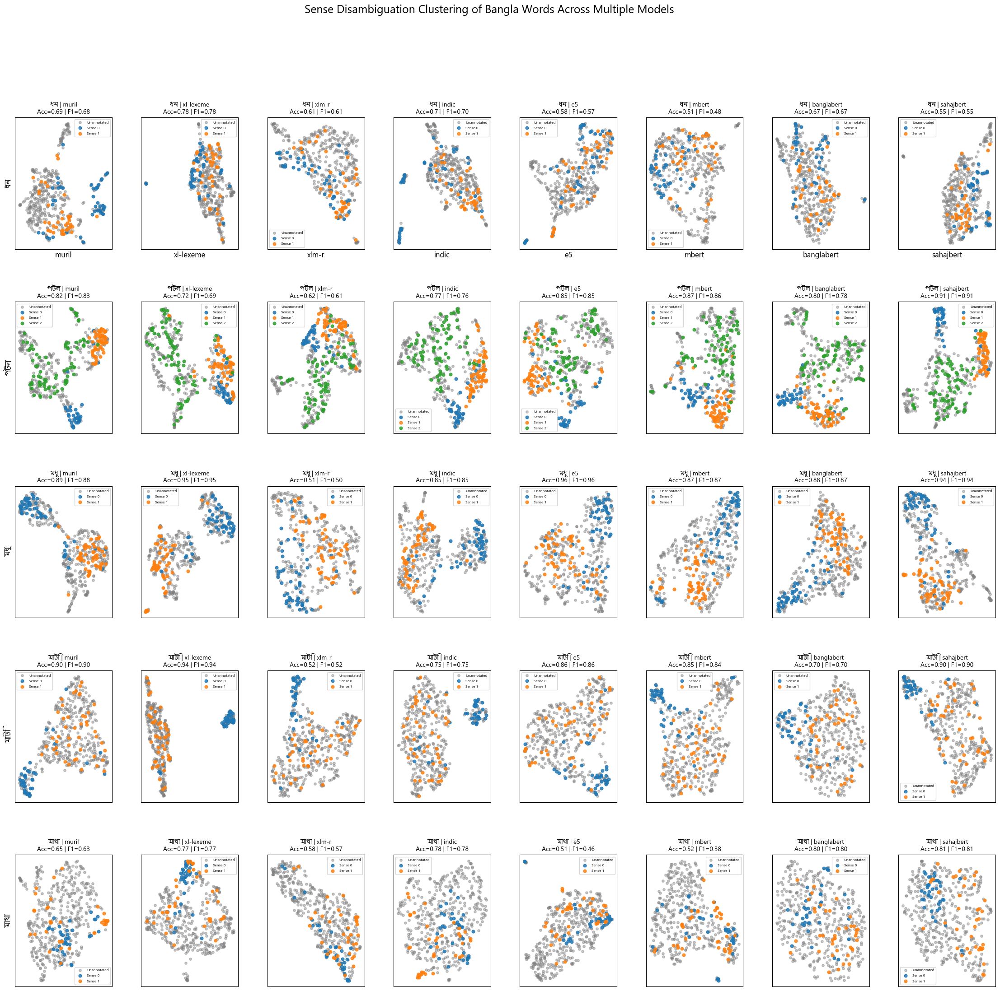


Model Performance Summary:

Model                          Mean Acc  Std Acc  Mean F1   Std F1
banglabert                     0.770    0.082   0.766   0.081
e5                             0.751    0.196   0.739   0.209
indic                          0.773    0.051   0.767   0.053
mbert                          0.722    0.192   0.686   0.234
muril                          0.789    0.117   0.785   0.125
sahajbert                      0.824    0.158   0.822   0.158
xl-lexeme                      0.833    0.104   0.827   0.112
xlm-r                          0.570    0.051   0.561   0.049


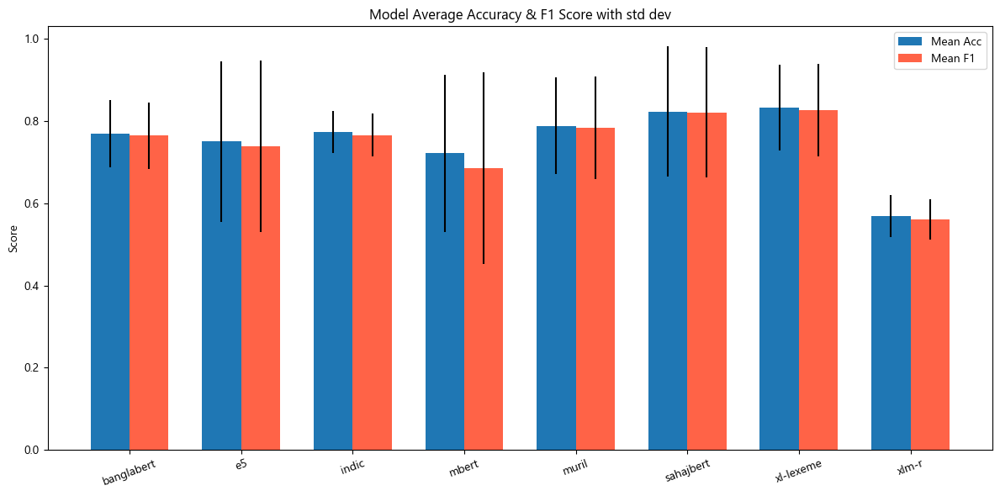

In [ ]:
import os # Filesystem utilities (listing directories, joining paths)
import pandas as pd  # DataFrame loading/manipulation for CSVs
import numpy as np  # Numerical arrays and vectorized operations
import matplotlib  # Matplotlib configuration (fonts, rcParams)
matplotlib.rcParams['font.family'] = 'Nirmala UI'  # Bangla-supporting font
import matplotlib.pyplot as plt  # Plotting API
plt.rcParams['font.family'] = 'Nirmala UI'  # Ensure pyplot also uses Bangla-capable font
import torch  # Check for GPU and manage device; not training here but used for inference mode/cuda
import umap  # UMAP for dimensionality reduction to 2D
from sklearn.cluster import KMeans  # KMeans clustering for annotated points
from sklearn.metrics import accuracy_score, f1_score  # Metrics after aligning cluster labels to gold
from sentence_transformers import SentenceTransformer  # Sentence embedding models

# 1. Auto-load all merged csv files in your folder
merge_folder = r'C:\Users\Student\Downloads\tonadim (2)\tonadim\merged1'  # Folder containing <word>_merged.csv files
WORDS = []  # Will hold tuples of (lemma, csv_path)
for fname in os.listdir(merge_folder):  # Iterate files in the merge folder
    if fname.endswith('_merged.csv'):  # Select files following the naming convention
        word = fname.split('_merged.csv')[0]  # Extract the lemma from the filename prefix
        WORDS.append((word, os.path.join(merge_folder, fname)))  # Store (lemma, full_path)
print("Loaded words/files:", [w for w, _ in WORDS])  # Log loaded lemmas for visibility

# 2. Define models to use (add more as needed)
MODELS = [  # Tuples of (short_name, Hugging Face model id)
    ('muril', "google/muril-base-cased"),
    ('xl-lexeme', "pierluigic/xl-lexeme"),
    ('xlm-r', "xlm-roberta-base"),
    ('indic', "ai4bharat/IndicBERTv2-MLM-only"),
    ('e5', 'intfloat/multilingual-e5-base'),
    ('mbert', "bert-base-multilingual-cased"),
    ('banglabert', "sagorsarker/bangla-bert-base"),    # BanglaBERT
    ('sahajbert', "neuropark/sahajBERT"), 
]

device = 'cuda' if torch.cuda.is_available() else 'cpu'  # Use GPU if available for faster embedding inference

# Function: get_embeddings(model_name, sentences)
# Purpose: 
#      Loads a Sentence-Transformers encoder for the given model.
#      Applies the E5 'query:' prefix convention when needed.
#      Encodes a list of sentences into dense vector embeddings.
# Inputs:
#      model_name (str): The HF model identifier to load (used by SentenceTransformer).
#      sentences (List[str]): The raw sentences to embed.
# Outputs:
#      emb (np.ndarray): A 2D array [num_sentences, dim] of embeddings.
def get_embeddings(model_name, sentences):
    if 'e5' in model_name.lower():
        sentences = [f"query: {s}" for s in sentences]  # E5 models expect a 'query:' prefix for query-style embeddings
    model = SentenceTransformer(model_name, device=device)  # Load ST model on chosen device
    emb = model.encode(sentences, show_progress_bar=False, batch_size=32)  # Batch-encode to embeddings
    return emb  # Return embeddings as a NumPy array

# Function: load_sentences_and_labels(csv_path)
# Purpose: 
#      Reads a merged CSV for a lemma.
#      Returns sentences and integer sense labels, using -1 for unannotated rows.
#      Also returns the sorted list of unique annotated sense IDs.
# Inputs:
#      csv_path (str): Path to the <word>_merged.csv file
# Outputs:
#      sentences (List[str]): All sentence strings from the file.
#      gold_senses (List[int]): Gold sense per sentence (>=0 if annotated, -1 if blank/unannotated).
#      unique_senses (List[int]): Sorted unique sense IDs present (excluding -1).
def load_sentences_and_labels(csv_path):
    df = pd.read_csv(csv_path, dtype={'sense': 'str'})  # Load CSV; keep 'sense' as string to detect blanks
    sentences = df['sentence'].tolist()  # Extract raw sentence text
    # Use -1 for unannotated (blank sense), else int(sense)
    gold_senses = [int(s) if (isinstance(s, str) and s.strip().isdigit()) else -1 for s in df['sense']]  # Map to ints
    unique_senses = sorted(set([s for s in gold_senses if s >= 0]))  # Unique annotated sense IDs
    return sentences, gold_senses, unique_senses  # Return sentences, labels, and sense inventory

# Function: clustering_metrics(true_labels, cluster_labels)
# Purpose: 
#      Aligns cluster IDs to gold sense IDs using the Hungarian algorithm (optimal 1–1 mapping between predicted clusters and true senses).
#      Computes accuracy and macro-F1 after alignment.
# Inputs:
#      true_labels (Iterable[int]): Gold sense IDs for annotated points.
#      cluster_labels (Iterable[int]): KMeans cluster IDs for the same points.
# Outputs:
#      acc (float): Accuracy after optimal label alignment.
#      f1  (float): Macro-F1 after optimal label alignment.
def clustering_metrics(true_labels, cluster_labels):
    from scipy.optimize import linear_sum_assignment                         # Import locally to avoid a global dependency at module load
    y_true = np.array(true_labels)                                           # Convert to NumPy
    y_pred = np.array(cluster_labels)                                        # Convert to NumPy
    D = max(y_pred.max(), y_true.max()) + 1                                  # Number of clusters/classes (assumes labels are 0..K-1)
    cost = np.zeros((D, D), dtype=int)                                       # Confusion matrix (we'll convert to a cost matrix)
    for i in range(len(y_true)):                                             # Populate confusion: rows=pred, cols=true
        cost[y_pred[i], y_true[i]] += 1
    row_ind, col_ind = linear_sum_assignment(cost.max() - cost)              # Solve for best alignment
    mapping = {row: col for row, col in zip(row_ind, col_ind)}               # Map predicted cluster → aligned true class
    mapped = [mapping.get(c, 0) for c in y_pred]                             # Relabel predictions under the optimal mapping
    acc = accuracy_score(y_true, mapped)                                     # Compute accuracy
    f1 = f1_score(y_true, mapped, average='macro')                           # Compute macro-F1
    return acc, f1                                                           # Return both metrics

color_map = ['grey', 'tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 'tab:brown',
             'tab:pink', 'tab:olive', 'tab:cyan', 'gold', 'deeppink', 'lime']  # Colors for plotting senses/unannotated

results = []                                                                  # Collect per-(word, model) metric rows for summary

fig, axs = plt.subplots(len(WORDS), len(MODELS), figsize=(28, 5*len(WORDS)))  # Grid of subplots (rows=words, cols=models)
plt.subplots_adjust(wspace=0.3, hspace=0.4)                                   # Spacing between subplots

for i, (word, csv_path) in enumerate(WORDS):                                  # Iterate words/CSV paths
    sentences, senses, unique_senses = load_sentences_and_labels(csv_path)    # Load sentences and labels
    sentences, senses = sentences[:500], senses[:500]                         # Limit to 500 for speed/clarity
    senses_np = np.array(senses)                                              # Numpy view of labels

    for j, (model_name, model_id) in enumerate(MODELS):                       # Iterate models
        print(f"Processing: {word} | {model_name}")                           # Progress logging
        try:
            emb = get_embeddings(model_id, sentences)                         # Compute sentence embeddings for this model
        except Exception as e:
            print(f"Model failed: {model_name}, {e}")                         # Fallback if model load/encode fails
            emb = np.random.randn(len(sentences), 384)                        # Random embeddings placeholder (prevents crash)
        reducer = umap.UMAP(n_components=2, random_state=42)                  # 2D UMAP reducer (cosine default ok for ST models)
        coords = reducer.fit_transform(emb)                                   # Reduce embeddings to 2D
        coords_np = np.array(coords)                                          # Ensure NumPy array
        ax = axs[i, j] if len(WORDS) > 1 else axs[j]                          # Select appropriate Axes for plotting

        # Plot unannotated (sense==-1) in grey
        unannot_idx = np.where(np.array(senses) == -1)[0]                     # Indices of unannotated sentences
        if len(unannot_idx) > 0:                                              # If any unannotated exist
            ax.scatter(coords_np[unannot_idx, 0], coords_np[unannot_idx, 1],
                       color='grey', label='Unannotated', alpha=0.45, s=15)    # Scatter in grey

        # Cluster ONLY on annotated points (senses >= 0)!
        annotated_idx = np.where(np.array(senses) >= 0)[0]                    # Indices of annotated sentences
        acc = f1 = 0.0  # Defaults if no annotation or no clusters
        if len(unique_senses) == 0 or len(annotated_idx) == 0:                # Handle degenerate cases
            clusters = np.zeros_like(senses_np)                               # Dummy cluster labels
        else:
            kmeans = KMeans(n_clusters=len(unique_senses), random_state=42).fit(np.array(emb)[annotated_idx])  # Fit KMeans on annotated embeddings
            clusters = np.full_like(senses_np, -1)                            # Initialize all as unassigned
            clusters[annotated_idx] = kmeans.labels_                          # Fill in predicted cluster for annotated points

            # Evaluate clustering only on annotated
            annotated_labels = senses_np[annotated_idx]                       # Gold labels (annotated subset)
            annotated_clusters = clusters[annotated_idx]                      # Predicted clusters (annotated subset)
            acc, f1 = clustering_metrics(annotated_labels, annotated_clusters)  # Compute aligned metrics

            # Plot annotated in color
            for k, sense in enumerate(unique_senses):                           # For each sense class
                idx = annotated_idx[annotated_labels == sense]                  # Points belonging to this sense
                color_idx = (k+1) % len(color_map)                              # Choose a non-grey color
                ax.scatter(coords_np[idx, 0], coords_np[idx, 1],
                           color=color_map[color_idx], label=f'Sense {sense}', alpha=0.85, s=23)  # Scatter annotated

        results.append({'word': word, 'model': model_name, 'acc': acc, 'f1': f1})  # Store metrics for summary

        ax.set_title(f"{word} | {model_name}\nAcc={acc:.2f} | F1={f1:.2f}", fontsize=10)  # Per-panel title with metrics
        ax.set_xticks([]); ax.set_yticks([])                                   # Hide axes ticks for cleaner plots
        if j == 0:
            ax.set_ylabel(word, fontsize=12)                                   # Left column labels the lemma
        if i == 0:
            ax.set_xlabel(model_name, fontsize=12)                             # Top row labels the model
        ax.legend(fontsize=6, loc='best')                                      # Legend for annotated/unannotated and senses

plt.suptitle("Sense Disambiguation Clustering of Bangla Words Across Multiple Models", fontsize=18)  # Figure title
plt.show()                                                                     # Render the grid of scatter plots

# ---- SUMMARY TABLE AND BARPLOTS ----
summary_df = pd.DataFrame(results)                                             # Convert per-(word, model) rows to DataFrame
summary_table = summary_df.groupby('model')[['acc', 'f1']].agg(['mean', 'std']).reset_index()  # Mean/std per model
summary_table.columns = ['Model', 'Mean Acc', 'Std Acc', 'Mean F1', 'Std F1']  # Flatten MultiIndex columns

print("\nModel Performance Summary:\n")                                        # Header for textual summary
print(f"{'Model':<30} {'Mean Acc':>8} {'Std Acc':>8} {'Mean F1':>8} {'Std F1':>8}")  # Column headings
for _, row in summary_table.iterrows():                                        # Print each model row
    print(f"{row['Model']:<30} {row['Mean Acc']:.3f}    {row['Std Acc']:.3f}   {row['Mean F1']:.3f}   {row['Std F1']:.3f}")

# Bar plot for average accuracy and F1 per model (side by side)
x = np.arange(len(summary_table['Model']))                                     # Bar positions per model
width = 0.35                                                                   # Half-width for side-by-side bars

plt.figure(figsize=(12,6))                                                     # Create a new figure for bars
plt.bar(x - width/2, summary_table['Mean Acc'], yerr=summary_table['Std Acc'], width=width, label='Mean Acc')  # Acc bars with error
plt.bar(x + width/2, summary_table['Mean F1'], yerr=summary_table['Std F1'], width=width, label='Mean F1', color='tomato')  # F1 bars with error
plt.xticks(x, summary_table['Model'], rotation=20)                             # Model labels on x-axis
plt.ylabel("Score")                                                            # Y-axis label
plt.title("Model Average Accuracy & F1 Score with std dev")                    # Plot title
plt.legend()                                                                   # Legend for bars
plt.tight_layout()                                                             # Reduce overlaps/margins
plt.show()                                                                  # Render bar chart
